In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import shap
import imblearn
import numpy as np
from scipy.stats import shapiro, levene, mannwhitneyu, ttest_ind
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score,classification_report,confusion_matrix
from sklearn.metrics import f1_score, accuracy_score, roc_curve, precision_score, recall_score
from sklearn.metrics import matthews_corrcoef,precision_recall_curve,auc
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import LeaveOneOut
import xgboost as xgb
from xgboost import XGBClassifier
from collections import Counter
from imblearn.over_sampling import BorderlineSMOTE,ADASYN,KMeansSMOTE,SVMSMOTE,SMOTE
from imblearn.under_sampling import TomekLinks,OneSidedSelection,EditedNearestNeighbours
from imblearn.ensemble import BalancedBaggingClassifier,EasyEnsembleClassifier,RUSBoostClassifier,BalancedRandomForestClassifier
from imblearn.combine import SMOTEENN,SMOTETomek
from imxgboost.imbalance_xgb import imbalance_xgboost as imb_xgb
from numpy.core.umath_tests import inner1d
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('seaborn')
plt.rcParams["figure.dpi"]=850

In [2]:
df = pd.read_csv("../Data/Training_Dataset.csv")
df.columns = [ "GeneType",'Gene Length', 'Isoform Number',
       'Exon Number', 'Average Exon Length', 'Average Intron Length',
       'Average 5UTR Length', 'Average 3UTR Length', 'Average CDS Length',
       'GC Content', 'Purine Content', 'Codon Usage Bias', 'stAI', 'EP1',
       'ESI1', 'EP2', 'ESI2', 'EP3', 'ESI3', 'EP4', 'ESI4']
print(df.shape)
print("Old singleton genens: ", df.loc[df['GeneType'] == 0].shape[0])
print("De novo genes: ", df.loc[df['GeneType'] == 1].shape[0])

(713, 21)
Old singleton genens:  672
De novo genes:  41


In [3]:
X_or = df.drop('GeneType', axis=1)
y = df['GeneType']
print("X shape : ", X_or.shape)
print("y shape : ", y.shape)

X shape :  (713, 20)
y shape :  (713,)


In [4]:
X_or

,Gene Length,Isoform Number,Exon Number,Average Exon Length,Average Intron Length,Average 5UTR Length,Average 3UTR Length,Average CDS Length,GC Content,Purine Content,Codon Usage Bias,stAI,EP1,ESI1,EP2,ESI2,EP3,ESI3,EP4,ESI4
0,1132,1,1,1132.000000,0.000000,562.000000,222.0,345.0,0.505747,0.591954,0.173657,0.3379,11.337949,0.998131,25.344828,0.969259,500,0.849925,535,0.874063
1,834,1,1,834.000000,0.000000,62.000000,406.0,363.0,0.510929,0.524590,0.145164,0.3378,5.573333,0.998349,8.551724,0.984517,122,0.745192,296,0.864368
2,662,1,1,662.000000,0.000000,96.000000,89.0,474.0,0.450734,0.570231,0.197770,0.3295,1.030513,0.987231,0.620690,0.977273,27,0.865385,29,0.867816
3,1146,1,2,360.000000,426.000000,66.500000,113.0,471.0,0.607595,0.561181,0.208173,0.4002,7.214872,0.998833,9.137931,0.983997,175,0.870192,400,0.868301
4,743,1,3,209.333333,57.500000,179.000000,57.0,210.0,0.450704,0.464789,0.216591,0.3204,2.394872,0.993761,4.344828,0.939970,83,0.639423,137,0.809524
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
708,16336,1,5,611.600000,3319.500000,86.000000,221.0,2748.0,0.530716,0.519447,0.107331,0.4253,5.208718,0.709246,9.965517,0.806349,218,0.393491,269,0.488844
709,3096,1,3,900.333333,197.500000,173.000000,458.0,2067.0,0.578744,0.504348,0.100084,0.4627,11.360256,0.710005,27.379310,0.641865,649,0.648438,733,0.651515
710,28142,2,7,834.285714,7674.800000,402.666667,1305.0,1791.0,0.607023,0.532887,0.107270,0.3958,4.542051,0.667733,16.482759,0.713612,458,0.638112,596,0.740887
711,1303,3,5,341.000000,60.000000,146.000000,330.5,435.0,0.541096,0.593607,0.167775,0.4565,0.846154,0.987215,2.206897,0.961982,63,0.634615,31,0.678161


In [5]:
df_unknown_or = pd.read_csv("../Data/Orphan_Dataset.csv")
df_unknown_or.columns = ['Gene Length', 'Isoform Number',
       'Exon Number', 'Average Exon Length', 'Average Intron Length',
       'Average 5UTR Length', 'Average 3UTR Length', 'Average CDS Length',
       'GC Content', 'Purine Content', 'Codon Usage Bias', 'stAI', 'EP1',
       'ESI1', 'EP2', 'ESI2', 'EP3', 'ESI3', 'EP4', 'ESI4']

In [6]:
df_unknown_or

,Gene Length,Isoform Number,Exon Number,Average Exon Length,Average Intron Length,Average 5UTR Length,Average 3UTR Length,Average CDS Length,GC Content,Purine Content,Codon Usage Bias,stAI,EP1,ESI1,EP2,ESI2,EP3,ESI3,EP4,ESI4
0,475,1,1,475.000000,0.000000,14.0,101.000000,357.0,0.544444,0.452778,0.209319,0.3302,2.500513,0.998866,1.103448,0.998848,11,0.932692,18,0.956897
1,593,1,2,258.000000,77.000000,53.5,127.000000,279.0,0.574468,0.492908,0.168616,0.3906,0.478718,0.980009,0.586207,1.000000,8,0.884615,10,0.862069
2,853,1,2,401.500000,50.000000,100.0,85.000000,615.0,0.485437,0.509709,0.126681,0.3992,3.154872,0.996786,4.206897,0.938889,91,0.769231,156,0.819310
3,1087,1,4,230.000000,55.666667,121.0,181.000000,615.0,0.555016,0.487055,0.138379,0.3690,0.929744,0.996553,2.758621,0.977405,33,0.721154,43,0.822660
4,267,1,1,267.000000,0.000000,32.0,61.000000,171.0,0.436782,0.471264,0.261382,0.4388,0.133077,0.945975,0.000000,0.947826,3,0.980769,8,0.979310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,659,1,1,659.000000,0.000000,134.0,66.000000,456.0,0.520697,0.535948,0.124049,0.3573,9.335641,0.998425,8.206897,0.957011,252,0.818182,480,0.872211
84,711,1,3,197.000000,60.000000,38.0,94.000000,456.0,0.492375,0.535948,0.202252,0.3696,0.292821,0.991970,0.689655,0.976190,17,0.820513,18,0.827586
85,1225,4,6,296.000000,177.000000,203.5,115.333333,391.5,0.439394,0.536797,0.163236,0.3449,7.230256,0.605174,3.827586,0.888889,98,0.661538,94,0.904828
86,533,2,3,202.333333,65.000000,20.0,48.000000,366.0,0.498645,0.485095,0.245185,0.4485,67.865641,0.999669,140.758621,0.994636,565,0.863213,571,0.955408


In [7]:
scaler = MinMaxScaler()
features = X_or.columns
X = X_or
X[features] = scaler.fit_transform(X_or[features])

In [8]:
X

,Gene Length,Isoform Number,Exon Number,Average Exon Length,Average Intron Length,Average 5UTR Length,Average 3UTR Length,Average CDS Length,GC Content,Purine Content,Codon Usage Bias,stAI,EP1,ESI1,EP2,ESI2,EP3,ESI3,EP4,ESI4
0,0.022234,0.000000,0.000000,0.262806,0.000000,0.218847,0.047264,0.015385,0.388396,0.722893,0.292044,0.328396,0.025086,0.997351,0.008310,0.948378,0.007369,0.791139,0.007872,0.808492
1,0.015296,0.000000,0.000000,0.188488,0.000000,0.024143,0.086438,0.016568,0.410582,0.513268,0.224690,0.328145,0.012331,0.997660,0.002804,0.974000,0.001787,0.645382,0.004356,0.793749
2,0.011291,0.000000,0.000000,0.145593,0.000000,0.037383,0.018948,0.023866,0.152855,0.655293,0.349045,0.307306,0.002279,0.981902,0.000204,0.961836,0.000384,0.812654,0.000427,0.798992
3,0.022560,0.000000,0.033333,0.070278,0.035845,0.025896,0.024058,0.023669,0.824460,0.627134,0.373637,0.484810,0.015963,0.998346,0.002996,0.973127,0.002570,0.819345,0.005886,0.799729
4,0.013177,0.000000,0.066667,0.032703,0.004838,0.069704,0.012135,0.006509,0.152729,0.327176,0.393536,0.284459,0.005297,0.991157,0.001425,0.899195,0.001211,0.498181,0.002016,0.710349
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
708,0.376202,0.000000,0.133333,0.133024,0.279313,0.033489,0.047051,0.173373,0.495301,0.497265,0.135256,0.547828,0.011524,0.587902,0.003268,0.674814,0.003205,0.155915,0.003958,0.222702
709,0.067958,0.000000,0.066667,0.205031,0.016618,0.067368,0.097509,0.128600,0.700934,0.450278,0.118125,0.641727,0.025135,0.588977,0.008977,0.398607,0.009570,0.510727,0.010786,0.470071
710,0.651060,0.066667,0.200000,0.188559,0.645782,0.156802,0.277837,0.110454,0.822013,0.539088,0.135112,0.473763,0.010049,0.529063,0.005405,0.519087,0.006749,0.496357,0.008770,0.605975
711,0.026215,0.133333,0.133333,0.065539,0.005049,0.056854,0.070364,0.021302,0.539743,0.728038,0.278140,0.626161,0.001871,0.981880,0.000724,0.936158,0.000916,0.491491,0.000456,0.510590


In [9]:
normal_features = []
non_normal_features = []
p_values = {}
for i, col in enumerate(X.columns):
    stat, p = shapiro(X.iloc[:, i])
    p_values[col] = p
    if p > 0.05:
        normal_features.append(col)
    else:
        non_normal_features.append(col)
for feature, p_value in p_values.items():
    print(f'{feature}: {p_value}')
print('---------------')
print('Normal_features: ',normal_features)

Gene Length: 2.3156122212634628e-38
Isoform Number: 3.852688743587862e-37
Exon Number: 6.509431811124805e-30
Average Exon Length: 5.466030364224405e-33
Average Intron Length: 3.2285916618043785e-42
Average 5UTR Length: 1.0147003518739355e-36
Average 3UTR Length: 6.204027299012235e-35
Average CDS Length: 7.858858583234592e-33
GC Content: 0.0327136404812336
Purine Content: 1.4748094301353376e-08
Codon Usage Bias: 7.688927531170782e-22
stAI: 2.506632401644282e-11
EP1: 1.6815581571897805e-44
ESI1: 2.3382435988513264e-14
EP2: 0.0
ESI2: 8.150123631534001e-11
EP3: 0.0
ESI3: 9.616988316807351e-10
EP4: 0.0
ESI4: 1.5059245583870506e-07
---------------
Normal_features:  []


In [10]:
group0 = df[df['GeneType'] == 0]
group1 = df[df['GeneType'] == 1]
significant_features = []
for column in df.columns:
    if column != 'GeneType':
        stat, p_value = mannwhitneyu(group0[column], group1[column], alternative='two-sided')
        print(f"{column} Mann-Whitney U test - p value: {p_value}")
        if p_value < 0.05: 
            significant_features.append(column)
print('---------------')
print("Significant_features: ", significant_features)

Gene Length Mann-Whitney U test - p value: 3.094595991123811e-14
Isoform Number Mann-Whitney U test - p value: 3.016024475981262e-05
Exon Number Mann-Whitney U test - p value: 2.8708850413876597e-13
Average Exon Length Mann-Whitney U test - p value: 0.004219262065257704
Average Intron Length Mann-Whitney U test - p value: 5.4341659868087865e-05
Average 5UTR Length Mann-Whitney U test - p value: 0.4261045293401339
Average 3UTR Length Mann-Whitney U test - p value: 0.008486644250880956
Average CDS Length Mann-Whitney U test - p value: 2.6522415158840692e-24
GC Content Mann-Whitney U test - p value: 2.841307932824955e-07
Purine Content Mann-Whitney U test - p value: 0.498311515856637
Codon Usage Bias Mann-Whitney U test - p value: 8.077527685569719e-21
stAI Mann-Whitney U test - p value: 1.0573540300076249e-20
EP1 Mann-Whitney U test - p value: 2.0250687212665206e-13
ESI1 Mann-Whitney U test - p value: 3.5016095620998466e-15
EP2 Mann-Whitney U test - p value: 7.254917463701948e-16
ESI2 Ma

In [11]:
kfold = StratifiedKFold(10,shuffle=True,random_state=888)
def KfoldEvaluate_sample(clf,train_data,target):
    F1_scorelist = []
    AUC_ROClist=[]
    MCClist=[]
    G_meanlist=[]
    AUCPRClist=[]
    target_scores = []
    targetchange = []
    for k,(train,test) in enumerate(kfold.split(train_data,target)):
        tl=TomekLinks(sampling_strategy='auto')
        X_new_train, y_new_train = tl.fit_resample(train_data[train],target[train])
        clffit = clf.fit(X_new_train,y_new_train)
        target_class = clffit.predict(train_data[test]) 
        targetchange.extend(target[test].ravel().tolist())

        tn, fp, fn, tp = confusion_matrix(target[test], target_class).ravel()
        recall = recall_score(target[test], target_class)  
        precision = precision_score(target[test], target_class)  
        AUC_ROC = roc_auc_score(target[test], target_class)  
        F1_score = f1_score(target[test], target_class,average="binary")  
        MCC = matthews_corrcoef(target[test], target_class)  
        G_mean = pow(recall * precision, 0.5)  
        precision_point, recall_point, _thresholds = precision_recall_curve(target[test], target_class)
        AUCPRC = auc(recall_point, precision_point)  

        F1_scorelist.append(F1_score)
        AUC_ROClist.append(AUC_ROC)
        MCClist.append(MCC)
        G_meanlist.append(G_mean)
        AUCPRClist.append(AUCPRC)

    F1_score = str(str(np.round(np.mean(np.array(F1_scorelist)),4))+"+-"+str(np.round(np.std(np.array(F1_scorelist)),4)))
    AUC_ROC = str(str(np.round(np.mean(np.array(AUC_ROClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUC_ROClist)), 4)))
    MCC = str(str(np.round(np.mean(np.array(MCClist)), 4)) + "+-" + str(np.round(np.std(np.array(MCClist)), 4)))
    G_mean = str(str(np.round(np.mean(np.array(G_meanlist)), 4)) + "+-" + str(np.round(np.std(np.array(G_meanlist)), 4)))
    AUCPRC = str(str(np.round(np.mean(np.array(AUCPRClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUCPRClist)), 4)))
    print("-------------------------------")
    print("AUCPRC",AUCPRC)
    print("G-mean",G_mean)
    print("MCC",MCC)
    print("F1-score",F1_score)
    print("AUCROC",AUC_ROC)
    print("-------------------------------")

    return (AUCPRC,G_mean,MCC,F1_score,AUC_ROC)

In [12]:
clf=LogisticRegression()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7406+-0.0971
G-mean 0.6705+-0.1368
MCC 0.6597+-0.1389
F1-score 0.6236+-0.1683
AUCROC 0.7418+-0.0894
-------------------------------
('0.7406+-0.0971', '0.6705+-0.1368', '0.6597+-0.1389', '0.6236+-0.1683', '0.7418+-0.0894')


In [13]:
clf=KNeighborsClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8148+-0.1628
G-mean 0.7848+-0.1779
MCC 0.776+-0.1848
F1-score 0.7655+-0.1875
AUCROC 0.8293+-0.1136
-------------------------------
('0.8148+-0.1628', '0.7848+-0.1779', '0.776+-0.1848', '0.7655+-0.1875', '0.8293+-0.1136')


In [14]:
clf=SVC()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8366+-0.0612
G-mean 0.8096+-0.0763
MCC 0.8012+-0.0785
F1-score 0.7925+-0.0892
AUCROC 0.8393+-0.059
-------------------------------
('0.8366+-0.0612', '0.8096+-0.0763', '0.8012+-0.0785', '0.7925+-0.0892', '0.8393+-0.059')


In [15]:
clf=RandomForestClassifier(random_state=666)
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8595+-0.1175
G-mean 0.8334+-0.1517
MCC 0.8264+-0.1561
F1-score 0.817+-0.1773
AUCROC 0.876+-0.1121
-------------------------------
('0.8595+-0.1175', '0.8334+-0.1517', '0.8264+-0.1561', '0.817+-0.1773', '0.876+-0.1121')


In [16]:
clf=XGBClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8495+-0.0955
G-mean 0.8253+-0.128
MCC 0.8174+-0.131
F1-score 0.8106+-0.1526
AUCROC 0.8753+-0.0963
-------------------------------
('0.8495+-0.0955', '0.8253+-0.128', '0.8174+-0.131', '0.8106+-0.1526', '0.8753+-0.0963')


In [17]:
kfold = StratifiedKFold(10,shuffle=True,random_state=888)
def KfoldEvaluate_sample(clf,train_data,target):
    F1_scorelist = []
    AUC_ROClist=[]
    MCClist=[]
    G_meanlist=[]
    AUCPRClist=[]
    target_scores = []
    targetchange = []
    for k,(train,test) in enumerate(kfold.split(train_data,target)):
        tl = OneSidedSelection(sampling_strategy='auto',random_state=888)
        X_new_train, y_new_train = tl.fit_resample(train_data[train],target[train])
        clffit = clf.fit(X_new_train,y_new_train)
        target_class = clffit.predict(train_data[test]) 
        targetchange.extend(target[test].ravel().tolist())

        tn, fp, fn, tp = confusion_matrix(target[test], target_class).ravel()
        recall = recall_score(target[test], target_class)  
        precision = precision_score(target[test], target_class)  
        AUC_ROC = roc_auc_score(target[test], target_class)  
        F1_score = f1_score(target[test], target_class,average="binary")  
        MCC = matthews_corrcoef(target[test], target_class)  
        G_mean = pow(recall * precision, 0.5)  
        precision_point, recall_point, _thresholds = precision_recall_curve(target[test], target_class)
        AUCPRC = auc(recall_point, precision_point)  

        F1_scorelist.append(F1_score)
        AUC_ROClist.append(AUC_ROC)
        MCClist.append(MCC)
        G_meanlist.append(G_mean)
        AUCPRClist.append(AUCPRC)

    F1_score = str(str(np.round(np.mean(np.array(F1_scorelist)),4))+"+-"+str(np.round(np.std(np.array(F1_scorelist)),4)))
    AUC_ROC = str(str(np.round(np.mean(np.array(AUC_ROClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUC_ROClist)), 4)))
    MCC = str(str(np.round(np.mean(np.array(MCClist)), 4)) + "+-" + str(np.round(np.std(np.array(MCClist)), 4)))
    G_mean = str(str(np.round(np.mean(np.array(G_meanlist)), 4)) + "+-" + str(np.round(np.std(np.array(G_meanlist)), 4)))
    AUCPRC = str(str(np.round(np.mean(np.array(AUCPRClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUCPRClist)), 4)))
    print("-------------------------------")
    print("AUCPRC",AUCPRC)
    print("G-mean",G_mean)
    print("MCC",MCC)
    print("F1-score",F1_score)
    print("AUCROC",AUC_ROC)
    print("-------------------------------")

    return (AUCPRC,G_mean,MCC,F1_score,AUC_ROC)

In [18]:
clf=LogisticRegression()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7735+-0.0944
G-mean 0.7239+-0.1194
MCC 0.7136+-0.1223
F1-score 0.6908+-0.1401
AUCROC 0.7768+-0.0789
-------------------------------
('0.7735+-0.0944', '0.7239+-0.1194', '0.7136+-0.1223', '0.6908+-0.1401', '0.7768+-0.0789')


In [19]:
clf=KNeighborsClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8016+-0.1673
G-mean 0.7787+-0.1801
MCC 0.7685+-0.1877
F1-score 0.7655+-0.1875
AUCROC 0.8403+-0.1112
-------------------------------
('0.8016+-0.1673', '0.7787+-0.1801', '0.7685+-0.1877', '0.7655+-0.1875', '0.8403+-0.1112')


In [20]:
clf=SVC()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8502+-0.0948
G-mean 0.821+-0.1311
MCC 0.8135+-0.1339
F1-score 0.8023+-0.1578
AUCROC 0.8635+-0.1034
-------------------------------
('0.8502+-0.0948', '0.821+-0.1311', '0.8135+-0.1339', '0.8023+-0.1578', '0.8635+-0.1034')


In [21]:
clf=RandomForestClassifier(random_state=888)
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8538+-0.1228
G-mean 0.8319+-0.1523
MCC 0.8238+-0.1577
F1-score 0.8188+-0.1751
AUCROC 0.887+-0.1042
-------------------------------
('0.8538+-0.1228', '0.8319+-0.1523', '0.8238+-0.1577', '0.8188+-0.1751', '0.887+-0.1042')


In [22]:
clf=XGBClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8488+-0.1097
G-mean 0.8271+-0.1403
MCC 0.8189+-0.1443
F1-score 0.8142+-0.1637
AUCROC 0.887+-0.1034
-------------------------------
('0.8488+-0.1097', '0.8271+-0.1403', '0.8189+-0.1443', '0.8142+-0.1637', '0.887+-0.1034')


In [23]:
kfold = StratifiedKFold(10,shuffle=True,random_state=888)
def KfoldEvaluate_sample(clf,train_data,target):
    F1_scorelist = []
    AUC_ROClist=[]
    MCClist=[]
    G_meanlist=[]
    AUCPRClist=[]
    target_scores = []
    targetchange = []
    for k,(train,test) in enumerate(kfold.split(train_data,target)):
        tl=EditedNearestNeighbours(sampling_strategy='auto')
        X_new_train, y_new_train = tl.fit_resample(train_data[train],target[train])
        clffit = clf.fit(X_new_train,y_new_train)
        target_class = clffit.predict(train_data[test]) 
        targetchange.extend(target[test].ravel().tolist())

        tn, fp, fn, tp = confusion_matrix(target[test], target_class).ravel()
        recall = recall_score(target[test], target_class)  
        precision = precision_score(target[test], target_class)  
        AUC_ROC = roc_auc_score(target[test], target_class)  
        F1_score = f1_score(target[test], target_class,average="binary")  
        MCC = matthews_corrcoef(target[test], target_class)  
        G_mean = pow(recall * precision, 0.5)  
        precision_point, recall_point, _thresholds = precision_recall_curve(target[test], target_class)
        AUCPRC = auc(recall_point, precision_point)  

        F1_scorelist.append(F1_score)
        AUC_ROClist.append(AUC_ROC)
        MCClist.append(MCC)
        G_meanlist.append(G_mean)
        AUCPRClist.append(AUCPRC)

    F1_score = str(str(np.round(np.mean(np.array(F1_scorelist)),4))+"+-"+str(np.round(np.std(np.array(F1_scorelist)),4)))
    AUC_ROC = str(str(np.round(np.mean(np.array(AUC_ROClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUC_ROClist)), 4)))
    MCC = str(str(np.round(np.mean(np.array(MCClist)), 4)) + "+-" + str(np.round(np.std(np.array(MCClist)), 4)))
    G_mean = str(str(np.round(np.mean(np.array(G_meanlist)), 4)) + "+-" + str(np.round(np.std(np.array(G_meanlist)), 4)))
    AUCPRC = str(str(np.round(np.mean(np.array(AUCPRClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUCPRClist)), 4)))
    print("-------------------------------")
    print("AUCPRC",AUCPRC)
    print("G-mean",G_mean)
    print("MCC",MCC)
    print("F1-score",F1_score)
    print("AUCROC",AUC_ROC)
    print("-------------------------------")

    return (AUCPRC,G_mean,MCC,F1_score,AUC_ROC)

In [24]:
clf=LogisticRegression()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7499+-0.1076
G-mean 0.6825+-0.15
MCC 0.6721+-0.1525
F1-score 0.6375+-0.1833
AUCROC 0.7518+-0.1003
-------------------------------
('0.7499+-0.1076', '0.6825+-0.15', '0.6721+-0.1525', '0.6375+-0.1833', '0.7518+-0.1003')


In [25]:
clf=KNeighborsClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8602+-0.09
G-mean 0.8364+-0.1082
MCC 0.8292+-0.1123
F1-score 0.821+-0.1221
AUCROC 0.8643+-0.0881
-------------------------------
('0.8602+-0.09', '0.8364+-0.1082', '0.8292+-0.1123', '0.821+-0.1221', '0.8643+-0.0881')


In [26]:
clf=SVC()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8241+-0.0633
G-mean 0.798+-0.0756
MCC 0.7887+-0.0781
F1-score 0.7817+-0.0872
AUCROC 0.8385+-0.0586
-------------------------------
('0.8241+-0.0633', '0.798+-0.0756', '0.7887+-0.0781', '0.7817+-0.0872', '0.8385+-0.0586')


In [27]:
clf=RandomForestClassifier(random_state=888)
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8942+-0.1246
G-mean 0.876+-0.1583
MCC 0.8707+-0.1632
F1-score 0.8646+-0.1829
AUCROC 0.9228+-0.1148
-------------------------------
('0.8942+-0.1246', '0.876+-0.1583', '0.8707+-0.1632', '0.8646+-0.1829', '0.9228+-0.1148')


In [28]:
clf=XGBClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8513+-0.0962
G-mean 0.8281+-0.1292
MCC 0.8202+-0.1322
F1-score 0.8138+-0.1538
AUCROC 0.887+-0.1025
-------------------------------
('0.8513+-0.0962', '0.8281+-0.1292', '0.8202+-0.1322', '0.8138+-0.1538', '0.887+-0.1025')


In [29]:
kfold = StratifiedKFold(10,shuffle=True,random_state=888)
def KfoldEvaluate_sample(clf,train_data,target):
    F1_scorelist = []
    AUC_ROClist=[]
    MCClist=[]
    G_meanlist=[]
    AUCPRClist=[]
    target_scores = []
    targetchange = []
    for k,(train,test) in enumerate(kfold.split(train_data,target)):
        tl = SMOTE(sampling_strategy="auto",random_state=8888)
        X_new_train, y_new_train = tl.fit_resample(train_data[train],target[train])
        clffit = clf.fit(X_new_train,y_new_train)
        target_class = clffit.predict(train_data[test]) 
        targetchange.extend(target[test].ravel().tolist())

        tn, fp, fn, tp = confusion_matrix(target[test], target_class).ravel()
        recall = recall_score(target[test], target_class)  
        precision = precision_score(target[test], target_class)  
        AUC_ROC = roc_auc_score(target[test], target_class)  
        F1_score = f1_score(target[test], target_class,average="binary")  
        MCC = matthews_corrcoef(target[test], target_class)  
        G_mean = pow(recall * precision, 0.5)  
        precision_point, recall_point, _thresholds = precision_recall_curve(target[test], target_class)
        AUCPRC = auc(recall_point, precision_point)  

        F1_scorelist.append(F1_score)
        AUC_ROClist.append(AUC_ROC)
        MCClist.append(MCC)
        G_meanlist.append(G_mean)
        AUCPRClist.append(AUCPRC)

    F1_score = str(str(np.round(np.mean(np.array(F1_scorelist)),4))+"+-"+str(np.round(np.std(np.array(F1_scorelist)),4)))
    AUC_ROC = str(str(np.round(np.mean(np.array(AUC_ROClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUC_ROClist)), 4)))
    MCC = str(str(np.round(np.mean(np.array(MCClist)), 4)) + "+-" + str(np.round(np.std(np.array(MCClist)), 4)))
    G_mean = str(str(np.round(np.mean(np.array(G_meanlist)), 4)) + "+-" + str(np.round(np.std(np.array(G_meanlist)), 4)))
    AUCPRC = str(str(np.round(np.mean(np.array(AUCPRClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUCPRClist)), 4)))
    print("-------------------------------")
    print("AUCPRC",AUCPRC)
    print("G-mean",G_mean)
    print("MCC",MCC)
    print("F1-score",F1_score)
    print("AUCROC",AUC_ROC)
    print("-------------------------------")

    return (AUCPRC,G_mean,MCC,F1_score,AUC_ROC)

In [30]:
clf=LogisticRegression()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7714+-0.0717
G-mean 0.7526+-0.0747
MCC 0.7353+-0.0806
F1-score 0.7372+-0.0774
AUCROC 0.9354+-0.0569
-------------------------------
('0.7714+-0.0717', '0.7526+-0.0747', '0.7353+-0.0806', '0.7372+-0.0774', '0.9354+-0.0569')


In [31]:
clf=KNeighborsClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8409+-0.102
G-mean 0.8261+-0.1115
MCC 0.8148+-0.1199
F1-score 0.8146+-0.1203
AUCROC 0.9396+-0.0598
-------------------------------
('0.8409+-0.102', '0.8261+-0.1115', '0.8148+-0.1199', '0.8146+-0.1203', '0.9396+-0.0598')


In [32]:
clf=SVC()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8154+-0.0812
G-mean 0.7987+-0.0853
MCC 0.7854+-0.0915
F1-score 0.7853+-0.0894
AUCROC 0.9373+-0.0575
-------------------------------
('0.8154+-0.0812', '0.7987+-0.0853', '0.7854+-0.0915', '0.7853+-0.0894', '0.9373+-0.0575')


In [33]:
clf=RandomForestClassifier(random_state=888)
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8364+-0.0942
G-mean 0.8137+-0.1265
MCC 0.8044+-0.1295
F1-score 0.7992+-0.1508
AUCROC 0.8973+-0.1065
-------------------------------
('0.8364+-0.0942', '0.8137+-0.1265', '0.8044+-0.1295', '0.7992+-0.1508', '0.8973+-0.1065')


In [34]:
clf=XGBClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7936+-0.0944
G-mean 0.7665+-0.1221
MCC 0.7535+-0.1255
F1-score 0.7478+-0.1447
AUCROC 0.8928+-0.1043
-------------------------------
('0.7936+-0.0944', '0.7665+-0.1221', '0.7535+-0.1255', '0.7478+-0.1447', '0.8928+-0.1043')


In [35]:
kfold = StratifiedKFold(10,shuffle=True,random_state=888)
def KfoldEvaluate_sample(clf,train_data,target):
    F1_scorelist = []
    AUC_ROClist=[]
    MCClist=[]
    G_meanlist=[]
    AUCPRClist=[]
    target_scores = []
    targetchange = []
    for k,(train,test) in enumerate(kfold.split(train_data,target)):
        tl= BorderlineSMOTE(sampling_strategy="auto",random_state=888, kind="borderline-2")
        X_new_train, y_new_train = tl.fit_resample(train_data[train],target[train])
        clffit = clf.fit(X_new_train,y_new_train)
        target_class = clffit.predict(train_data[test]) 
        targetchange.extend(target[test].ravel().tolist())

        tn, fp, fn, tp = confusion_matrix(target[test], target_class).ravel()
        recall = recall_score(target[test], target_class)  
        precision = precision_score(target[test], target_class)  
        AUC_ROC = roc_auc_score(target[test], target_class)  
        F1_score = f1_score(target[test], target_class,average="binary")  
        MCC = matthews_corrcoef(target[test], target_class)  
        G_mean = pow(recall * precision, 0.5)  
        precision_point, recall_point, _thresholds = precision_recall_curve(target[test], target_class)
        AUCPRC = auc(recall_point, precision_point)  

        F1_scorelist.append(F1_score)
        AUC_ROClist.append(AUC_ROC)
        MCClist.append(MCC)
        G_meanlist.append(G_mean)
        AUCPRClist.append(AUCPRC)

    F1_score = str(str(np.round(np.mean(np.array(F1_scorelist)),4))+"+-"+str(np.round(np.std(np.array(F1_scorelist)),4)))
    AUC_ROC = str(str(np.round(np.mean(np.array(AUC_ROClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUC_ROClist)), 4)))
    MCC = str(str(np.round(np.mean(np.array(MCClist)), 4)) + "+-" + str(np.round(np.std(np.array(MCClist)), 4)))
    G_mean = str(str(np.round(np.mean(np.array(G_meanlist)), 4)) + "+-" + str(np.round(np.std(np.array(G_meanlist)), 4)))
    AUCPRC = str(str(np.round(np.mean(np.array(AUCPRClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUCPRClist)), 4)))
    print("-------------------------------")
    print("AUCPRC",AUCPRC)
    print("G-mean",G_mean)
    print("MCC",MCC)
    print("F1-score",F1_score)
    print("AUCROC",AUC_ROC)
    print("-------------------------------")

    return (AUCPRC,G_mean,MCC,F1_score,AUC_ROC)

In [36]:
clf=LogisticRegression()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7266+-0.0408
G-mean 0.6704+-0.0615
MCC 0.6442+-0.0686
F1-score 0.6194+-0.0784
AUCROC 0.9605+-0.0146
-------------------------------
('0.7266+-0.0408', '0.6704+-0.0615', '0.6442+-0.0686', '0.6194+-0.0784', '0.9605+-0.0146')


In [37]:
clf=KNeighborsClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.6722+-0.1132
G-mean 0.6214+-0.1324
MCC 0.5896+-0.1465
F1-score 0.5789+-0.1487
AUCROC 0.9083+-0.0691
-------------------------------
('0.6722+-0.1132', '0.6214+-0.1324', '0.5896+-0.1465', '0.5789+-0.1487', '0.9083+-0.0691')


In [38]:
clf=SVC()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7218+-0.0844
G-mean 0.6821+-0.098
MCC 0.6577+-0.1071
F1-score 0.6475+-0.1122
AUCROC 0.932+-0.0555
-------------------------------
('0.7218+-0.0844', '0.6821+-0.098', '0.6577+-0.1071', '0.6475+-0.1122', '0.932+-0.0555')


In [39]:
clf=RandomForestClassifier(random_state=888)
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7742+-0.1604
G-mean 0.7556+-0.1727
MCC 0.7411+-0.18
F1-score 0.7419+-0.179
AUCROC 0.9148+-0.1247
-------------------------------
('0.7742+-0.1604', '0.7556+-0.1727', '0.7411+-0.18', '0.7419+-0.179', '0.9148+-0.1247')


In [40]:
clf=XGBClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8135+-0.093
G-mean 0.7966+-0.1031
MCC 0.783+-0.1105
F1-score 0.7826+-0.1129
AUCROC 0.9483+-0.0555
-------------------------------
('0.8135+-0.093', '0.7966+-0.1031', '0.783+-0.1105', '0.7826+-0.1129', '0.9483+-0.0555')


In [41]:
kfold = StratifiedKFold(10,shuffle=True,random_state=888)
def KfoldEvaluate_sample(clf,train_data,target):
    F1_scorelist = []
    AUC_ROClist=[]
    MCClist=[]
    G_meanlist=[]
    AUCPRClist=[]
    target_scores = []
    targetchange = []
    for k,(train,test) in enumerate(kfold.split(train_data,target)):
        tl = ADASYN(sampling_strategy="auto",random_state=888)
        X_new_train, y_new_train = tl.fit_resample(train_data[train],target[train])
        clffit = clf.fit(X_new_train,y_new_train)
        target_class = clffit.predict(train_data[test]) 
        targetchange.extend(target[test].ravel().tolist())

        tn, fp, fn, tp = confusion_matrix(target[test], target_class).ravel()
        recall = recall_score(target[test], target_class)  
        precision = precision_score(target[test], target_class)  
        AUC_ROC = roc_auc_score(target[test], target_class)  
        F1_score = f1_score(target[test], target_class,average="binary")  
        MCC = matthews_corrcoef(target[test], target_class)  
        G_mean = pow(recall * precision, 0.5)  
        precision_point, recall_point, _thresholds = precision_recall_curve(target[test], target_class)
        AUCPRC = auc(recall_point, precision_point)  

        F1_scorelist.append(F1_score)
        AUC_ROClist.append(AUC_ROC)
        MCClist.append(MCC)
        G_meanlist.append(G_mean)
        AUCPRClist.append(AUCPRC)

    F1_score = str(str(np.round(np.mean(np.array(F1_scorelist)),4))+"+-"+str(np.round(np.std(np.array(F1_scorelist)),4)))
    AUC_ROC = str(str(np.round(np.mean(np.array(AUC_ROClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUC_ROClist)), 4)))
    MCC = str(str(np.round(np.mean(np.array(MCClist)), 4)) + "+-" + str(np.round(np.std(np.array(MCClist)), 4)))
    G_mean = str(str(np.round(np.mean(np.array(G_meanlist)), 4)) + "+-" + str(np.round(np.std(np.array(G_meanlist)), 4)))
    AUCPRC = str(str(np.round(np.mean(np.array(AUCPRClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUCPRClist)), 4)))
    print("-------------------------------")
    print("AUCPRC",AUCPRC)
    print("G-mean",G_mean)
    print("MCC",MCC)
    print("F1-score",F1_score)
    print("AUCROC",AUC_ROC)
    print("-------------------------------")

    return (AUCPRC,G_mean,MCC,F1_score,AUC_ROC)

In [42]:
clf=LogisticRegression()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7558+-0.0617
G-mean 0.7294+-0.0649
MCC 0.7102+-0.0696
F1-score 0.7062+-0.0694
AUCROC 0.9409+-0.0533
-------------------------------
('0.7558+-0.0617', '0.7294+-0.0649', '0.7102+-0.0696', '0.7062+-0.0694', '0.9409+-0.0533')


In [43]:
clf=KNeighborsClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7424+-0.1197
G-mean 0.7231+-0.1275
MCC 0.7043+-0.1366
F1-score 0.7086+-0.132
AUCROC 0.9079+-0.0838
-------------------------------
('0.7424+-0.1197', '0.7231+-0.1275', '0.7043+-0.1366', '0.7086+-0.132', '0.9079+-0.0838')


In [44]:
clf=SVC()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7685+-0.0835
G-mean 0.7499+-0.0879
MCC 0.7327+-0.0941
F1-score 0.7348+-0.0916
AUCROC 0.9329+-0.0599
-------------------------------
('0.7685+-0.0835', '0.7499+-0.0879', '0.7327+-0.0941', '0.7348+-0.0916', '0.9329+-0.0599')


In [45]:
clf=RandomForestClassifier(random_state=888)
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7905+-0.1495
G-mean 0.7769+-0.1583
MCC 0.7646+-0.1645
F1-score 0.7698+-0.1621
AUCROC 0.8833+-0.1029
-------------------------------
('0.7905+-0.1495', '0.7769+-0.1583', '0.7646+-0.1645', '0.7698+-0.1621', '0.8833+-0.1029')


In [46]:
clf=XGBClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7575+-0.1473
G-mean 0.7414+-0.1561
MCC 0.726+-0.1627
F1-score 0.7312+-0.1597
AUCROC 0.8913+-0.1072
-------------------------------
('0.7575+-0.1473', '0.7414+-0.1561', '0.726+-0.1627', '0.7312+-0.1597', '0.8913+-0.1072')


In [47]:
kfold = StratifiedKFold(10,shuffle=True,random_state=888)
def KfoldEvaluate_sample(clf,train_data,target):
    F1_scorelist = []
    AUC_ROClist=[]
    MCClist=[]
    G_meanlist=[]
    AUCPRClist=[]
    target_scores = []
    targetchange = []
    for k,(train,test) in enumerate(kfold.split(train_data,target)):
        tl = SVMSMOTE(sampling_strategy="auto",random_state=888)   
        X_new_train, y_new_train = tl.fit_resample(train_data[train],target[train])
        clffit = clf.fit(X_new_train,y_new_train)
        target_class = clffit.predict(train_data[test]) 
        targetchange.extend(target[test].ravel().tolist())

        tn, fp, fn, tp = confusion_matrix(target[test], target_class).ravel()
        recall = recall_score(target[test], target_class)  
        precision = precision_score(target[test], target_class)  
        AUC_ROC = roc_auc_score(target[test], target_class)  
        F1_score = f1_score(target[test], target_class,average="binary")  
        MCC = matthews_corrcoef(target[test], target_class)  
        G_mean = pow(recall * precision, 0.5)  
        precision_point, recall_point, _thresholds = precision_recall_curve(target[test], target_class)
        AUCPRC = auc(recall_point, precision_point)  

        F1_scorelist.append(F1_score)
        AUC_ROClist.append(AUC_ROC)
        MCClist.append(MCC)
        G_meanlist.append(G_mean)
        AUCPRClist.append(AUCPRC)

    F1_score = str(str(np.round(np.mean(np.array(F1_scorelist)),4))+"+-"+str(np.round(np.std(np.array(F1_scorelist)),4)))
    AUC_ROC = str(str(np.round(np.mean(np.array(AUC_ROClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUC_ROClist)), 4)))
    MCC = str(str(np.round(np.mean(np.array(MCClist)), 4)) + "+-" + str(np.round(np.std(np.array(MCClist)), 4)))
    G_mean = str(str(np.round(np.mean(np.array(G_meanlist)), 4)) + "+-" + str(np.round(np.std(np.array(G_meanlist)), 4)))
    AUCPRC = str(str(np.round(np.mean(np.array(AUCPRClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUCPRClist)), 4)))
    print("-------------------------------")
    print("AUCPRC",AUCPRC)
    print("G-mean",G_mean)
    print("MCC",MCC)
    print("F1-score",F1_score)
    print("AUCROC",AUC_ROC)
    print("-------------------------------")

    return (AUCPRC,G_mean,MCC,F1_score,AUC_ROC)

In [48]:
clf=LogisticRegression()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7905+-0.0794
G-mean 0.7698+-0.0873
MCC 0.7538+-0.0947
F1-score 0.7528+-0.0959
AUCROC 0.9361+-0.0547
-------------------------------
('0.7905+-0.0794', '0.7698+-0.0873', '0.7538+-0.0947', '0.7528+-0.0959', '0.9361+-0.0547')


In [49]:
clf=KNeighborsClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7879+-0.1224
G-mean 0.7704+-0.1311
MCC 0.7558+-0.1399
F1-score 0.7578+-0.1377
AUCROC 0.9123+-0.0812
-------------------------------
('0.7879+-0.1224', '0.7704+-0.1311', '0.7558+-0.1399', '0.7578+-0.1377', '0.9123+-0.0812')


In [50]:
clf=SVC()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8181+-0.0689
G-mean 0.8017+-0.0738
MCC 0.7885+-0.079
F1-score 0.7879+-0.0788
AUCROC 0.9491+-0.0538
-------------------------------
('0.8181+-0.0689', '0.8017+-0.0738', '0.7885+-0.079', '0.7879+-0.0788', '0.9491+-0.0538')


In [51]:
clf=RandomForestClassifier(random_state=888)
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8584+-0.0868
G-mean 0.8348+-0.124
MCC 0.8265+-0.1265
F1-score 0.8181+-0.1507
AUCROC 0.9215+-0.1107
-------------------------------
('0.8584+-0.0868', '0.8348+-0.124', '0.8265+-0.1265', '0.8181+-0.1507', '0.9215+-0.1107')


In [52]:
clf=XGBClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8628+-0.0454
G-mean 0.8509+-0.0467
MCC 0.8418+-0.0497
F1-score 0.842+-0.048
AUCROC 0.945+-0.0543
-------------------------------
('0.8628+-0.0454', '0.8509+-0.0467', '0.8418+-0.0497', '0.842+-0.048', '0.945+-0.0543')


In [53]:
kfold = StratifiedKFold(10,shuffle=True,random_state=888)
def KfoldEvaluate_sample(clf,train_data,target):
    F1_scorelist = []
    AUC_ROClist=[]
    MCClist=[]
    G_meanlist=[]
    AUCPRClist=[]
    target_scores = []
    targetchange = []
    for k,(train,test) in enumerate(kfold.split(train_data,target)):
        tl= SMOTEENN(sampling_strategy="auto",random_state=888)
        X_new_train, y_new_train = tl.fit_resample(train_data[train],target[train])
        clffit = clf.fit(X_new_train,y_new_train)
        target_class = clffit.predict(train_data[test]) 
        targetchange.extend(target[test].ravel().tolist())

        tn, fp, fn, tp = confusion_matrix(target[test], target_class).ravel()
        recall = recall_score(target[test], target_class)  
        precision = precision_score(target[test], target_class)  
        AUC_ROC = roc_auc_score(target[test], target_class)  
        F1_score = f1_score(target[test], target_class,average="binary")  
        MCC = matthews_corrcoef(target[test], target_class)  
        G_mean = pow(recall * precision, 0.5)  
        precision_point, recall_point, _thresholds = precision_recall_curve(target[test], target_class)
        AUCPRC = auc(recall_point, precision_point)  

        F1_scorelist.append(F1_score)
        AUC_ROClist.append(AUC_ROC)
        MCClist.append(MCC)
        G_meanlist.append(G_mean)
        AUCPRClist.append(AUCPRC)

    F1_score = str(str(np.round(np.mean(np.array(F1_scorelist)),4))+"+-"+str(np.round(np.std(np.array(F1_scorelist)),4)))
    AUC_ROC = str(str(np.round(np.mean(np.array(AUC_ROClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUC_ROClist)), 4)))
    MCC = str(str(np.round(np.mean(np.array(MCClist)), 4)) + "+-" + str(np.round(np.std(np.array(MCClist)), 4)))
    G_mean = str(str(np.round(np.mean(np.array(G_meanlist)), 4)) + "+-" + str(np.round(np.std(np.array(G_meanlist)), 4)))
    AUCPRC = str(str(np.round(np.mean(np.array(AUCPRClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUCPRClist)), 4)))
    print("-------------------------------")
    print("AUCPRC",AUCPRC)
    print("G-mean",G_mean)
    print("MCC",MCC)
    print("F1-score",F1_score)
    print("AUCROC",AUC_ROC)
    print("-------------------------------")

    return (AUCPRC,G_mean,MCC,F1_score,AUC_ROC)

In [54]:
clf=LogisticRegression()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7699+-0.0848
G-mean 0.744+-0.0916
MCC 0.7256+-0.0985
F1-score 0.7207+-0.0978
AUCROC 0.9534+-0.051
-------------------------------
('0.7699+-0.0848', '0.744+-0.0916', '0.7256+-0.0985', '0.7207+-0.0978', '0.9534+-0.051')


In [55]:
clf=KNeighborsClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8089+-0.0619
G-mean 0.7868+-0.0676
MCC 0.7724+-0.073
F1-score 0.7675+-0.0746
AUCROC 0.9469+-0.0507
-------------------------------
('0.8089+-0.0619', '0.7868+-0.0676', '0.7724+-0.073', '0.7675+-0.0746', '0.9469+-0.0507')


In [56]:
clf=SVC()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8117+-0.0618
G-mean 0.7945+-0.0648
MCC 0.7807+-0.0695
F1-score 0.7799+-0.0679
AUCROC 0.9484+-0.0532
-------------------------------
('0.8117+-0.0618', '0.7945+-0.0648', '0.7807+-0.0695', '0.7799+-0.0679', '0.9484+-0.0532')


In [57]:
clf=RandomForestClassifier(random_state=888)
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8584+-0.0868
G-mean 0.8348+-0.124
MCC 0.8265+-0.1265
F1-score 0.8181+-0.1507
AUCROC 0.9215+-0.1107
-------------------------------
('0.8584+-0.0868', '0.8348+-0.124', '0.8265+-0.1265', '0.8181+-0.1507', '0.9215+-0.1107')


In [58]:
clf=XGBClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8057+-0.0934
G-mean 0.7893+-0.0968
MCC 0.7759+-0.102
F1-score 0.7761+-0.0975
AUCROC 0.9373+-0.08
-------------------------------
('0.8057+-0.0934', '0.7893+-0.0968', '0.7759+-0.102', '0.7761+-0.0975', '0.9373+-0.08')


In [59]:
kfold = StratifiedKFold(10,shuffle=True,random_state=888)
def KfoldEvaluate_sample(clf,train_data,target):
    F1_scorelist = []
    AUC_ROClist=[]
    MCClist=[]
    G_meanlist=[]
    AUCPRClist=[]
    target_scores = []
    targetchange = []
    for k,(train,test) in enumerate(kfold.split(train_data,target)):
        tl= SMOTETomek(sampling_strategy="auto",random_state=888)
        X_new_train, y_new_train = tl.fit_resample(train_data[train],target[train])
        clffit = clf.fit(X_new_train,y_new_train)
        target_class = clffit.predict(train_data[test]) 
        targetchange.extend(target[test].ravel().tolist())

        tn, fp, fn, tp = confusion_matrix(target[test], target_class).ravel()
        recall = recall_score(target[test], target_class)  
        precision = precision_score(target[test], target_class)  
        AUC_ROC = roc_auc_score(target[test], target_class)  
        F1_score = f1_score(target[test], target_class,average="binary")  
        MCC = matthews_corrcoef(target[test], target_class)  
        G_mean = pow(recall * precision, 0.5)  
        precision_point, recall_point, _thresholds = precision_recall_curve(target[test], target_class)
        AUCPRC = auc(recall_point, precision_point)  

        F1_scorelist.append(F1_score)
        AUC_ROClist.append(AUC_ROC)
        MCClist.append(MCC)
        G_meanlist.append(G_mean)
        AUCPRClist.append(AUCPRC)

    F1_score = str(str(np.round(np.mean(np.array(F1_scorelist)),4))+"+-"+str(np.round(np.std(np.array(F1_scorelist)),4)))
    AUC_ROC = str(str(np.round(np.mean(np.array(AUC_ROClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUC_ROClist)), 4)))
    MCC = str(str(np.round(np.mean(np.array(MCClist)), 4)) + "+-" + str(np.round(np.std(np.array(MCClist)), 4)))
    G_mean = str(str(np.round(np.mean(np.array(G_meanlist)), 4)) + "+-" + str(np.round(np.std(np.array(G_meanlist)), 4)))
    AUCPRC = str(str(np.round(np.mean(np.array(AUCPRClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUCPRClist)), 4)))
    print("-------------------------------")
    print("AUCPRC",AUCPRC)
    print("G-mean",G_mean)
    print("MCC",MCC)
    print("F1-score",F1_score)
    print("AUCROC",AUC_ROC)
    print("-------------------------------")

    return (AUCPRC,G_mean,MCC,F1_score,AUC_ROC)

In [60]:
clf=LogisticRegression()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7789+-0.0656
G-mean 0.7605+-0.0696
MCC 0.7439+-0.0753
F1-score 0.7456+-0.0737
AUCROC 0.9361+-0.0559
-------------------------------
('0.7789+-0.0656', '0.7605+-0.0696', '0.7439+-0.0753', '0.7456+-0.0737', '0.9361+-0.0559')


In [61]:
clf=KNeighborsClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8278+-0.0945
G-mean 0.8125+-0.0994
MCC 0.8004+-0.1066
F1-score 0.8003+-0.1038
AUCROC 0.9388+-0.0588
-------------------------------
('0.8278+-0.0945', '0.8125+-0.0994', '0.8004+-0.1066', '0.8003+-0.1038', '0.9388+-0.0588')


In [62]:
clf=SVC()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8228+-0.0681
G-mean 0.8077+-0.0723
MCC 0.795+-0.0773
F1-score 0.7952+-0.0762
AUCROC 0.9498+-0.0542
-------------------------------
('0.8228+-0.0681', '0.8077+-0.0723', '0.795+-0.0773', '0.7952+-0.0762', '0.9498+-0.0542')


In [63]:
clf=RandomForestClassifier(random_state=888)
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8607+-0.092
G-mean 0.8376+-0.1277
MCC 0.8299+-0.1303
F1-score 0.822+-0.1536
AUCROC 0.9105+-0.1094
-------------------------------
('0.8607+-0.092', '0.8376+-0.1277', '0.8299+-0.1303', '0.822+-0.1536', '0.9105+-0.1094')


In [64]:
clf=XGBClassifier()
print(KfoldEvaluate_sample(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8036+-0.1004
G-mean 0.776+-0.1278
MCC 0.7638+-0.1317
F1-score 0.7567+-0.1503
AUCROC 0.8936+-0.1043
-------------------------------
('0.8036+-0.1004', '0.776+-0.1278', '0.7638+-0.1317', '0.7567+-0.1503', '0.8936+-0.1043')


In [65]:
kfold = StratifiedKFold(10,shuffle=True,random_state=666)
def KfoldEvaluate_E(clf,train_data,target):
    F1_scorelist = []
    AUC_ROClist=[]
    MCClist=[]
    G_meanlist=[]
    AUCPRClist=[]
    target_scores = []
    targetchange = [] 
    for k,(train,test) in enumerate(kfold.split(train_data,target)):
        clffit = clf.fit(train_data[train],target[train])
        target_class = clffit.predict(train_data[test]) 
        targetchange.extend(target[test].ravel().tolist())
        tn, fp, fn, tp = confusion_matrix(target[test], target_class).ravel()
        recall = recall_score(target[test], target_class)  
        precision = precision_score(target[test], target_class) 
        AUC_ROC = roc_auc_score(target[test], target_class)  
        F1_score = f1_score(target[test], target_class,average="binary")  
        MCC = matthews_corrcoef(target[test], target_class)  
        G_mean = pow(recall * precision, 0.5)  
        precision_point, recall_point, _thresholds = precision_recall_curve(target[test], target_class)
        AUCPRC = auc(recall_point, precision_point)  

        F1_scorelist.append(F1_score)
        AUC_ROClist.append(AUC_ROC)
        MCClist.append(MCC)
        G_meanlist.append(G_mean)
        AUCPRClist.append(AUCPRC)

    F1_score = str(str(np.round(np.mean(np.array(F1_scorelist)),4))+"+-"+str(np.round(np.std(np.array(F1_scorelist)),4)))
    AUC_ROC = str(str(np.round(np.mean(np.array(AUC_ROClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUC_ROClist)), 4)))
    MCC = str(str(np.round(np.mean(np.array(MCClist)), 4)) + "+-" + str(np.round(np.std(np.array(MCClist)), 4)))
    G_mean = str(str(np.round(np.mean(np.array(G_meanlist)), 4)) + "+-" + str(np.round(np.std(np.array(G_meanlist)), 4)))
    AUCPRC = str(str(np.round(np.mean(np.array(AUCPRClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUCPRClist)), 4)))

    print("-------------------------------")
    print("AUCPRC",AUCPRC)
    print("G-mean",G_mean)
    print("MCC",MCC)
    print("F1-score",F1_score)
    print("AUCROC",AUC_ROC)
    print("-------------------------------")
    
    return (AUCPRC,G_mean,MCC,F1_score,AUC_ROC)

In [66]:
eec=EasyEnsembleClassifier(random_state=666)
print(KfoldEvaluate_E(eec,X.values,y.values))

-------------------------------
AUCPRC 0.7761+-0.0954
G-mean 0.7444+-0.1063
MCC 0.7258+-0.1144
F1-score 0.7158+-0.1166
AUCROC 0.957+-0.0583
-------------------------------
('0.7761+-0.0954', '0.7444+-0.1063', '0.7258+-0.1144', '0.7158+-0.1166', '0.957+-0.0583')


In [67]:
rusc=RUSBoostClassifier(random_state=666)
print(KfoldEvaluate_E(rusc,X.values,y.values))

-------------------------------
AUCPRC 0.7146+-0.144
G-mean 0.6744+-0.1609
MCC 0.6476+-0.1773
F1-score 0.6404+-0.1743
AUCROC 0.9223+-0.0819
-------------------------------
('0.7146+-0.144', '0.6744+-0.1609', '0.6476+-0.1773', '0.6404+-0.1743', '0.9223+-0.0819')


In [68]:
bbc=BalancedBaggingClassifier(random_state=666)
print(KfoldEvaluate_E(bbc,X.values,y.values))

-------------------------------
AUCPRC 0.8057+-0.1041
G-mean 0.7807+-0.1156
MCC 0.7654+-0.1249
F1-score 0.7587+-0.1253
AUCROC 0.9504+-0.0668
-------------------------------
('0.8057+-0.1041', '0.7807+-0.1156', '0.7654+-0.1249', '0.7587+-0.1253', '0.9504+-0.0668')


In [69]:
brc=BalancedRandomForestClassifier(random_state=666)
print(KfoldEvaluate_E(brc,X.values,y.values))

-------------------------------
AUCPRC 0.7737+-0.1198
G-mean 0.7414+-0.1335
MCC 0.7217+-0.1452
F1-score 0.7125+-0.1459
AUCROC 0.9554+-0.0633
-------------------------------
('0.7737+-0.1198', '0.7414+-0.1335', '0.7217+-0.1452', '0.7125+-0.1459', '0.9554+-0.0633')


In [70]:
clf=LogisticRegression(class_weight="balanced",random_state=666)
print(KfoldEvaluate_E(clf,X.values,y.values))

-------------------------------
AUCPRC 0.7621+-0.1371
G-mean 0.736+-0.1499
MCC 0.7163+-0.1622
F1-score 0.7143+-0.161
AUCROC 0.9335+-0.0746
-------------------------------
('0.7621+-0.1371', '0.736+-0.1499', '0.7163+-0.1622', '0.7143+-0.161', '0.9335+-0.0746')


In [71]:
clf=SVC(class_weight='balanced',random_state=666)
print(KfoldEvaluate_E(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8026+-0.1001
G-mean 0.7798+-0.1131
MCC 0.7645+-0.1214
F1-score 0.7604+-0.125
AUCROC 0.9504+-0.065
-------------------------------
('0.8026+-0.1001', '0.7798+-0.1131', '0.7645+-0.1214', '0.7604+-0.125', '0.9504+-0.065')


In [72]:
clf=RandomForestClassifier(class_weight='balanced',random_state=666)
print(KfoldEvaluate_E(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8434+-0.1115
G-mean 0.8082+-0.1518
MCC 0.8007+-0.1558
F1-score 0.7848+-0.1811
AUCROC 0.856+-0.1226
-------------------------------
('0.8434+-0.1115', '0.8082+-0.1518', '0.8007+-0.1558', '0.7848+-0.1811', '0.856+-0.1226')


In [73]:
clf=XGBClassifier(scale_pos_weight=15 ,seed=666)
print(KfoldEvaluate_E(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8632+-0.0692
G-mean 0.8464+-0.0813
MCC 0.8382+-0.0847
F1-score 0.8348+-0.09
AUCROC 0.9131+-0.0872
-------------------------------
('0.8632+-0.0692', '0.8464+-0.0813', '0.8382+-0.0847', '0.8348+-0.09', '0.9131+-0.0872')


In [74]:
kfold = StratifiedKFold(10,shuffle=True,random_state=666)
def KfoldEvaluate_focal(clf,train_data,target):
    F1_scorelist = []
    AUC_ROClist=[]
    MCClist=[]
    G_meanlist=[]
    AUCPRClist=[]
    target_scores = []
    targetchange = []   
    for k,(train,test) in enumerate(kfold.split(train_data,target)):
        clf.fit(train_data[train],target[train])
        target_class = clf.predict_determine(train_data[test]) 
        targetchange.extend(target[test].ravel().tolist())
        tn, fp, fn, tp = confusion_matrix(target[test], target_class).ravel()
        recall = recall_score(target[test], target_class)  
        precision = precision_score(target[test], target_class)  
        AUC_ROC = roc_auc_score(target[test], target_class)  
        F1_score = f1_score(target[test], target_class,average="binary")  
        MCC = matthews_corrcoef(target[test], target_class) 
        G_mean = pow(recall * precision, 0.5) 
        precision_point, recall_point, _thresholds = precision_recall_curve(target[test], target_class)
        AUCPRC = auc(recall_point, precision_point)  

        F1_scorelist.append(F1_score)
        AUC_ROClist.append(AUC_ROC)
        MCClist.append(MCC)
        G_meanlist.append(G_mean)
        AUCPRClist.append(AUCPRC)

    F1_score = str(str(np.round(np.mean(np.array(F1_scorelist)),4))+"+-"+str(np.round(np.std(np.array(F1_scorelist)),4)))
    AUC_ROC = str(str(np.round(np.mean(np.array(AUC_ROClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUC_ROClist)), 4)))
    MCC = str(str(np.round(np.mean(np.array(MCClist)), 4)) + "+-" + str(np.round(np.std(np.array(MCClist)), 4)))
    G_mean = str(str(np.round(np.mean(np.array(G_meanlist)), 4)) + "+-" + str(np.round(np.std(np.array(G_meanlist)), 4)))
    AUCPRC = str(str(np.round(np.mean(np.array(AUCPRClist)), 4)) + "+-" + str(np.round(np.std(np.array(AUCPRClist)), 4)))

    print("-------------------------------")
    print("AUCPRC",AUCPRC)
    print("G-mean",G_mean)
    print("MCC",MCC)
    print("F1-score",F1_score)
    print("AUCROC",AUC_ROC)
    print("-------------------------------")
    
    return (AUCPRC,G_mean,MCC,F1_score,AUC_ROC)

In [75]:
np.random.seed(6666)
clf = imb_xgb(special_objective='focal',focal_gamma=4)
print(KfoldEvaluate_focal(clf,X.values,y.values))

-------------------------------
AUCPRC 0.8688+-0.1186
G-mean 0.8438+-0.1517
MCC 0.8368+-0.1567
F1-score 0.8277+-0.1762
AUCROC 0.8903+-0.1126
-------------------------------
('0.8688+-0.1186', '0.8438+-0.1517', '0.8368+-0.1567', '0.8277+-0.1762', '0.8903+-0.1126')


In [76]:
class AdaCostClassifier(AdaBoostClassifier):
    def _boost_real(self, iboost, X, y, sample_weight, random_state):
        estimator = self._make_estimator(random_state=random_state)
        estimator.fit(X, y, sample_weight=sample_weight)

        y_predict_proba = estimator.predict_proba(X)

        if iboost == 0:
            self.classes_ = getattr(estimator, 'classes_', None)
            self.n_classes_ = len(self.classes_)

        y_predict = self.classes_.take(np.argmax(y_predict_proba, axis=1),
                                       axis=0)

        incorrect = y_predict != y

        estimator_error = np.mean(
            np.average(incorrect, weights=sample_weight, axis=0))

        if estimator_error <= 0:
            return sample_weight, 1., 0.

        n_classes = self.n_classes_
        classes = self.classes_
        y_codes = np.array([-1. / (n_classes - 1), 1.])
        y_coding = y_codes.take(classes == y[:, np.newaxis])

        proba = y_predict_proba  
        proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps

        estimator_weight = (-1. * self.learning_rate
                                * (((n_classes - 1.) / n_classes) *
                                   inner1d(y_coding, np.log(y_predict_proba))))

        if not iboost == self.n_estimators - 1:
            sample_weight *= np.exp(estimator_weight *
                                    ((sample_weight > 0) |
                                     (estimator_weight < 0)) *
                                    self._beta(y, y_predict)) 
        return sample_weight, 1., estimator_error


    def _beta(self, y, y_hat):
        res = []
        for i in zip(y, y_hat):
            if i[0] == i[1]:
                res.append(1)  
            elif i[0] == 1 and i[1] == -1:
                res.append(1.25) 
            elif i[0] == -1 and i[1] == 1:
                res.append(1) 
            else:
                print('Data anomalies：')
                print(i[0], i[1])

        return np.array(res)

In [77]:
y_ada = y.replace({0:-1},inplace=False)
clf_ada=AdaCostClassifier(n_estimators=100,random_state=666)
print(KfoldEvaluate_E(clf_ada,X.values,y_ada.values))

-------------------------------
AUCPRC 0.9+-0.1267
G-mean 0.8903+-0.1377
MCC 0.8844+-0.1452
F1-score 0.8849+-0.1426
AUCROC 0.9303+-0.0964
-------------------------------
('0.9+-0.1267', '0.8903+-0.1377', '0.8844+-0.1452', '0.8849+-0.1426', '0.9303+-0.0964')


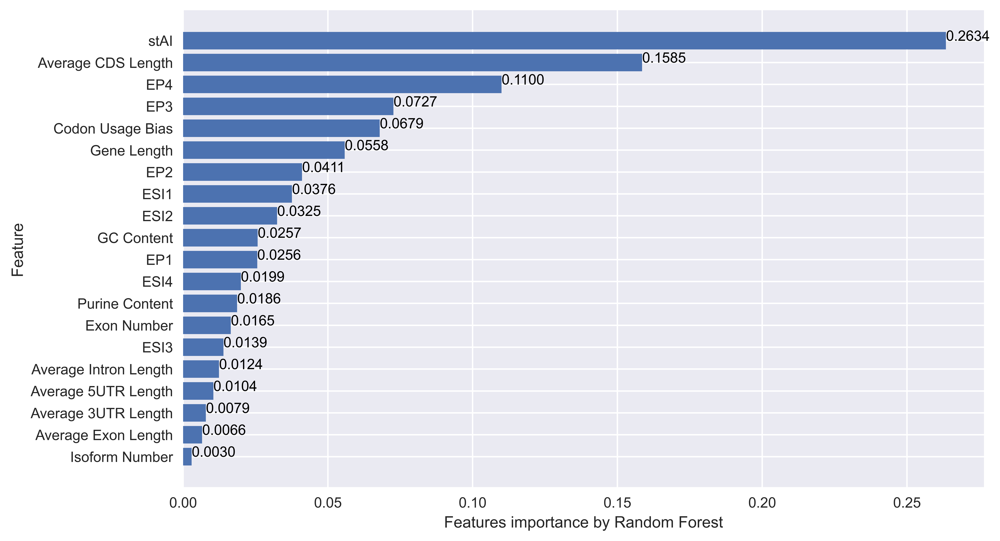

In [78]:
clf = RandomForestClassifier(random_state = 42)
clf.fit(X,y)
feature_importances = clf.feature_importances_
feature_names = X.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=True)
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel('Features importance by Random Forest')
plt.ylabel('Feature')
for i, v in enumerate(importance_df['Importance']):
    plt.text(v, i, f'{v:.4f}', color='black')
plt.show()

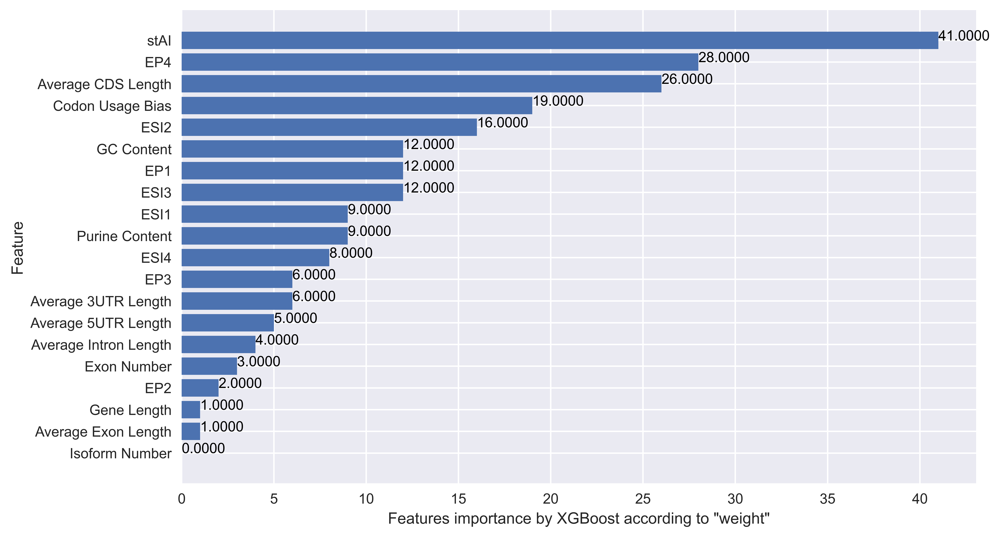

In [79]:
clf = XGBClassifier(scale_pos_weight=15, seed=42)
clf.fit(X, y)
feature_importances = clf.get_booster().get_score(importance_type='weight')
importance_df = pd.DataFrame.from_dict(feature_importances, orient='index', columns=['Importance'])
importance_df.loc['Isoform Number'] = 0
importance_df = importance_df.sort_values(by='Importance', ascending=True)

plt.figure(figsize=(10, 6))
plt.barh(importance_df.index, importance_df['Importance'])
plt.xlabel('Features importance by XGBoost according to "weight"')
plt.ylabel('Feature')
for i, v in enumerate(importance_df['Importance']):
    plt.text(v, i, f'{v:.4f}', color='black')
plt.show()

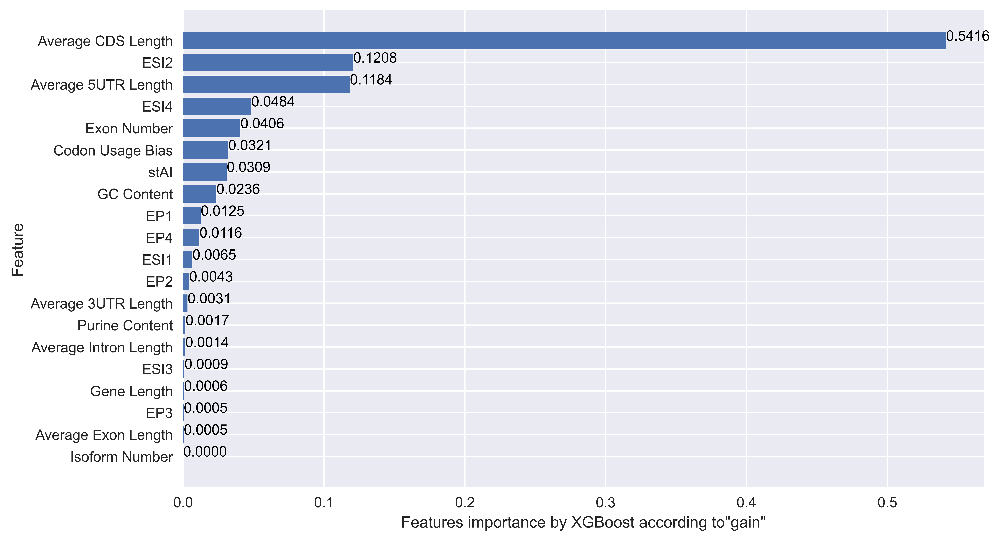

In [80]:
clf = XGBClassifier(scale_pos_weight=15,seed=666)
clf.fit(X,y)
feature_importances = clf.feature_importances_
feature_names = X.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=True)
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel('Features importance by XGBoost according to"gain"')
plt.ylabel('Feature')
for i, v in enumerate(importance_df['Importance']):
    plt.text(v, i, f'{v:.4f}', color='black')
plt.show()

In [81]:
loo = LeaveOneOut()
def LooEvaluate(clf,train_data,target):
    targetclass = []
    target_scores = []
    targetchange = []
    for k,(train,test) in enumerate(loo.split(train_data,target)):
        clffit = clf.fit(train_data[train],target[train])
        target_class = clffit.predict(train_data[test])   
        targetclass.extend(target_class.ravel().tolist())   
        targetchange.extend(target[test].ravel().tolist())  
    tn, fp, fn, tp = confusion_matrix(targetchange,targetclass).ravel()
    recall = recall_score(targetchange,targetclass) 
    precision = precision_score(targetchange,targetclass) 
    AUC_ROC = roc_auc_score(targetchange,targetclass)  
    F1_score = f1_score(targetchange,targetclass,average="binary") 
    MCC = matthews_corrcoef(targetchange,targetclass)
    G_mean = pow(recall * precision, 0.5)
    precision_point, recall_point, _thresholds = precision_recall_curve(targetchange,targetclass)
    AUCPRC = auc(recall_point, precision_point)
    
    print("----------------LOO---------------")
    print("AUCPRC",AUCPRC)
    print("G-mean",G_mean)
    print("MCC",MCC)
    print("F1-score",F1_score)
    print("AUCROC",AUC_ROC)
    print("-------------------------------")

    return (AUCPRC,G_mean,MCC,F1_score,AUC_ROC)

In [82]:
clf_ada = AdaCostClassifier()
X_se_ada = X
print(LooEvaluate(clf_ada,X_se_ada.values,y_ada.values))

----------------LOO---------------
AUCPRC 0.8790024417055512
G-mean 0.8729434821372646
MCC 0.8656714945687944
F1-score 0.8717948717948718
AUCROC 0.9124020034843204
-------------------------------
(0.8790024417055512, 0.8729434821372646, 0.8656714945687944, 0.8717948717948718, 0.9124020034843204)


In [83]:
X_se_ada = X.drop(['Isoform Number'], axis=1) 
print(LooEvaluate(clf_ada,X_se_ada.values,y_ada.values))

----------------LOO---------------
AUCPRC 0.8790024417055512
G-mean 0.8729434821372646
MCC 0.8656714945687944
F1-score 0.8717948717948718
AUCROC 0.9124020034843204
-------------------------------
(0.8790024417055512, 0.8729434821372646, 0.8656714945687944, 0.8717948717948718, 0.9124020034843204)


In [84]:
X_se_ada = X.drop(['Isoform Number','Gene Length'], axis=1) 
print(LooEvaluate(clf_ada,X_se_ada.values,y_ada.values))

----------------LOO---------------
AUCPRC 0.8915631577146951
G-mean 0.8867155358917449
MCC 0.8801160185711
F1-score 0.8860759493670887
AUCROC 0.9245971254355401
-------------------------------
(0.8915631577146951, 0.8867155358917449, 0.8801160185711, 0.8860759493670887, 0.9245971254355401)


In [85]:
X_se_ada = X.drop(['Isoform Number','Gene Length','Average Exon Length'], axis=1) 
print(LooEvaluate(clf_ada,X_se_ada.values,y_ada.values))

----------------LOO---------------
AUCPRC 0.8925307016043512
G-mean 0.8889566369846307
MCC 0.8822741006675088
F1-score 0.888888888888889
AUCROC 0.9360481997677119
-------------------------------
(0.8925307016043512, 0.8889566369846307, 0.8822741006675088, 0.888888888888889, 0.9360481997677119)


In [86]:
X_se_ada = X.drop(['Isoform Number','Gene Length','Average Exon Length','EP3'], axis=1) 
print(LooEvaluate(clf_ada,X_se_ada.values,y_ada.values))

----------------LOO---------------
AUCPRC 0.8945007517596715
G-mean 0.8916309815169777
MCC 0.8849382974099205
F1-score 0.8915662650602411
AUCROC 0.9474992740998838
-------------------------------
(0.8945007517596715, 0.8916309815169777, 0.8849382974099205, 0.8915662650602411, 0.9474992740998838)


In [87]:
X_se_ada = X.drop(['Isoform Number','Gene Length','Average Exon Length','EP3','Average Intron Length'], axis=1) 
print(LooEvaluate(clf_ada,X_se_ada.values,y_ada.values))

----------------LOO---------------
AUCPRC 0.9073788860788898
G-mean 0.9050184656361278
MCC 0.8990920155182431
F1-score 0.9047619047619047
AUCROC 0.9596943960511034
-------------------------------
(0.9073788860788898, 0.9050184656361278, 0.8990920155182431, 0.9047619047619047, 0.9596943960511034)


In [88]:
clf_ada = AdaCostClassifier()
print(KfoldEvaluate_E(clf_ada,X_se_ada.values,y_ada.values))
print(LooEvaluate(clf_ada,X_se_ada.values,y_ada.values))

-------------------------------
AUCPRC 0.9135+-0.0817
G-mean 0.9046+-0.0897
MCC 0.8993+-0.0945
F1-score 0.8992+-0.0943
AUCROC 0.9403+-0.0729
-------------------------------
('0.9135+-0.0817', '0.9046+-0.0897', '0.8993+-0.0945', '0.8992+-0.0943', '0.9403+-0.0729')
----------------LOO---------------
AUCPRC 0.9073788860788898
G-mean 0.9050184656361278
MCC 0.8990920155182431
F1-score 0.9047619047619047
AUCROC 0.9596943960511034
-------------------------------
(0.9073788860788898, 0.9050184656361278, 0.8990920155182431, 0.9047619047619047, 0.9596943960511034)


In [89]:
features = df_unknown_or.columns
df_unknown = df_unknown_or
df_unknown[features] = scaler.fit_transform(df_unknown_or[features])
X_test_ada=df_unknown.drop(['Isoform Number','Gene Length','Average Exon Length','EP3','Average Intron Length'], axis=1)

In [90]:
clf_ada.fit(X_se_ada,y_ada)
predictions_ada = clf_ada.predict(X_test_ada)
class_counts = pd.Series(predictions_ada).value_counts()
class_0_count = class_counts[-1]
class_1_count = class_counts[1]
print("Class 0 count:", class_0_count)
print("Class 1 count:", class_1_count)

Class 0 count: 59
Class 1 count: 29


In [91]:
class_1_indices = np.where(predictions_ada == 1)[0]
print("Indices of samples predicted as class 1:")
print(class_1_indices)

Indices of samples predicted as class 1:
[ 0  7  8  9 11 18 19 24 26 35 38 40 41 46 47 52 55 65 67 68 69 73 74 76
 79 81 83 85 87]


In [92]:
FlyBaseID = pd.read_csv('../Data/FlyBaseID.csv')
indices_ada = [ 0, 7, 8, 9, 11, 18, 19, 24, 26, 35, 38, 40, 41, 46, 47, 52, 55, 65, 67, 68, 69, 73, 74, 76, 79, 81, 83, 85, 87]
selected_ids = FlyBaseID .loc[indices_ada, 'FlyBaseID'].tolist()
print(selected_ids)

['FBgn0029535', 'FBgn0031786', 'FBgn0051606', 'FBgn0032039', 'FBgn0051882', 'FBgn0032740', 'FBgn0037500', 'FBgn0051206', 'FBgn0038944', 'FBgn0050485', 'FBgn0033280', 'FBgn0040778', 'FBgn0053494', 'FBgn0054025', 'FBgn0083936', 'FBgn0085309', 'FBgn0250831', 'FBgn0263597', 'FBgn0040694', 'FBgn0015585', 'FBgn0030374', 'FBgn0030905', 'FBgn0030936', 'FBgn0052192', 'FBgn0052163', 'FBgn0036439', 'FBgn0035782', 'FBgn0051955', 'FBgn0051949']


In [93]:
clf_xgb = XGBClassifier(scale_pos_weight=15, seed=666)
X_se = X.drop(['Gene Length'], axis=1) 
print(LooEvaluate(clf_xgb,X_se.values,y.values))

----------------LOO---------------
AUCPRC 0.8445429822460918
G-mean 0.8395701571521511
MCC 0.8299134020012915
F1-score 0.8395061728395061
AUCROC 0.9101698606271776
-------------------------------
(0.8445429822460918, 0.8395701571521511, 0.8299134020012915, 0.8395061728395061, 0.9101698606271776)


In [94]:
X_se = X.drop(['Isoform Number','Gene Length'], axis=1) 
print(LooEvaluate(clf_xgb,X_se.values,y.values))

----------------LOO---------------
AUCPRC 0.8445429822460918
G-mean 0.8395701571521511
MCC 0.8299134020012915
F1-score 0.8395061728395061
AUCROC 0.9101698606271776
-------------------------------
(0.8445429822460918, 0.8395701571521511, 0.8299134020012915, 0.8395061728395061, 0.9101698606271776)


In [95]:
X_se = X.drop(['Isoform Number','Gene Length','Average Exon Length'], axis=1) 
print(LooEvaluate(clf_xgb,X_se.values,y.values))

----------------LOO---------------
AUCPRC 0.8554404181435277
G-mean 0.8502657495766041
MCC 0.8413857451754088
F1-score 0.8500000000000001
AUCROC 0.9109139082462252
-------------------------------
(0.8554404181435277, 0.8502657495766041, 0.8413857451754088, 0.8500000000000001, 0.9109139082462252)


In [96]:
X_se = X.drop(['Isoform Number','Gene Length','Average Exon Length','Average Intron Length'], axis=1) 
print(LooEvaluate(clf_xgb,X_se.values,y.values))

----------------LOO---------------
AUCPRC 0.8685368419252215
G-mean 0.864263397068391
MCC 0.8560937513344001
F1-score 0.8641975308641976
AUCROC 0.9231090301974448
-------------------------------
(0.8685368419252215, 0.864263397068391, 0.8560937513344001, 0.8641975308641976, 0.9231090301974448)


In [97]:
X_se = X.drop(['Isoform Number','Gene Length','Average Exon Length','Average Intron Length','EP3'], axis=1) 
print(LooEvaluate(clf_xgb,X_se.values,y.values))

----------------LOO---------------
AUCPRC 0.8685368419252215
G-mean 0.864263397068391
MCC 0.8560937513344001
F1-score 0.8641975308641976
AUCROC 0.9231090301974448
-------------------------------
(0.8685368419252215, 0.864263397068391, 0.8560937513344001, 0.8641975308641976, 0.9231090301974448)


In [98]:
X_se = X.drop(['Isoform Number','Gene Length','Average Exon Length','Average Intron Length','EP3','Average 5UTR Length'], axis=1) 
print(LooEvaluate(clf_xgb,X_se.values,y.values))

----------------LOO---------------
AUCPRC 0.8685368419252215
G-mean 0.864263397068391
MCC 0.8560937513344001
F1-score 0.8641975308641976
AUCROC 0.9231090301974448
-------------------------------
(0.8685368419252215, 0.864263397068391, 0.8560937513344001, 0.8641975308641976, 0.9231090301974448)


In [99]:
X_se = X.drop(['Isoform Number','Gene Length','Average Exon Length','Average Intron Length','EP3','Average 5UTR Length','Average 3UTR Length'], axis=1) 
print(LooEvaluate(clf_xgb,X_se.values,y.values))

----------------LOO---------------
AUCPRC 0.8797547906431702
G-mean 0.8752735657406219
MCC 0.8678799392446606
F1-score 0.875
AUCROC 0.9238530778164924
-------------------------------
(0.8797547906431702, 0.8752735657406219, 0.8678799392446606, 0.875, 0.9238530778164924)


In [100]:
X_se = X.drop(['Isoform Number','Gene Length','Average Exon Length','Average Intron Length','EP3','Average 5UTR Length','Average 3UTR Length','EP2',], axis=1) 
print(LooEvaluate(clf_xgb,X_se.values,y.values))

----------------LOO---------------
AUCPRC 0.8797547906431702
G-mean 0.8752735657406219
MCC 0.8678799392446606
F1-score 0.875
AUCROC 0.9238530778164924
-------------------------------
(0.8797547906431702, 0.8752735657406219, 0.8678799392446606, 0.875, 0.9238530778164924)


In [101]:
clf_xgb = XGBClassifier(scale_pos_weight=15, seed=42)
param_grid = {
    'n_estimators': [80, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.3, 0.1, 0.01],
    'min_child_weight':[1, 3, 5]
}
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scoring = 'matthews_corrcoef'
grid_search = GridSearchCV(estimator=clf_xgb, param_grid=param_grid, scoring=scoring, cv=cv)
grid_search.fit(X_se, y)
print("Best Parameters: ", grid_search.best_params_)
print("Best Score (MCC): ", grid_search.best_score_)

Best Parameters:  {'learning_rate': 0.3, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 80}
Best Score (MCC):  0.909086770083294


In [102]:
clf_xgb_best = XGBClassifier(learning_rate=0.3,max_depth=3,n_estimators=80, min_child_weight=1, scale_pos_weight=15,seed=42)
print(KfoldEvaluate_E(clf_xgb_best,X_se.values,y.values))
print(LooEvaluate(clf_xgb_best,X_se.values,y.values))

-------------------------------
AUCPRC 0.9093+-0.0648
G-mean 0.8978+-0.075
MCC 0.8922+-0.079
F1-score 0.8899+-0.082
AUCROC 0.9395+-0.0712
-------------------------------
('0.9093+-0.0648', '0.8978+-0.075', '0.8922+-0.079', '0.8899+-0.082', '0.9395+-0.0712')
----------------LOO---------------
AUCPRC 0.8973366027807926
G-mean 0.8946750577612211
MCC 0.888040693547484
F1-score 0.8941176470588236
AUCROC 0.9589503484320557
-------------------------------
(0.8973366027807926, 0.8946750577612211, 0.888040693547484, 0.8941176470588236, 0.9589503484320557)


In [103]:
X_test=df_unknown.drop(['Isoform Number','Gene Length','Average Exon Length','Average Intron Length','EP3','Average 5UTR Length','Average 3UTR Length','EP2'], axis=1)

In [104]:
clf_xgb_best.fit(X_se,y)
predictions = clf_xgb_best.predict(X_test)
class_counts = pd.Series(predictions).value_counts()
class_0_count = class_counts[0]
class_1_count = class_counts[1]
print("Class 0 count:", class_0_count)
print("Class 1 count:", class_1_count)

Class 0 count: 59
Class 1 count: 29


In [105]:
class_1_indices = np.where(predictions == 1)[0]
print("Indices of samples predicted as class 1:")
print(class_1_indices)

Indices of samples predicted as class 1:
[ 0  5  6  7  8  9 11 18 19 24 26 35 38 40 41 46 47 52 55 67 68 69 73 74
 76 81 83 85 87]


In [106]:
indices = [0, 5, 6, 7, 8, 9, 11, 18, 19, 24, 26, 35, 38, 40, 41, 46, 47, 52, 55, 67, 68, 69, 73, 74, 76, 81, 83, 85, 87]
selected_ids = FlyBaseID .loc[indices, 'FlyBaseID'].tolist()
print(selected_ids)

['FBgn0029535', 'FBgn0002855', 'FBgn0002856', 'FBgn0031786', 'FBgn0051606', 'FBgn0032039', 'FBgn0051882', 'FBgn0032740', 'FBgn0037500', 'FBgn0051206', 'FBgn0038944', 'FBgn0050485', 'FBgn0033280', 'FBgn0040778', 'FBgn0053494', 'FBgn0054025', 'FBgn0083936', 'FBgn0085309', 'FBgn0250831', 'FBgn0040694', 'FBgn0015585', 'FBgn0030374', 'FBgn0030905', 'FBgn0030936', 'FBgn0052192', 'FBgn0036439', 'FBgn0035782', 'FBgn0051955', 'FBgn0051949']


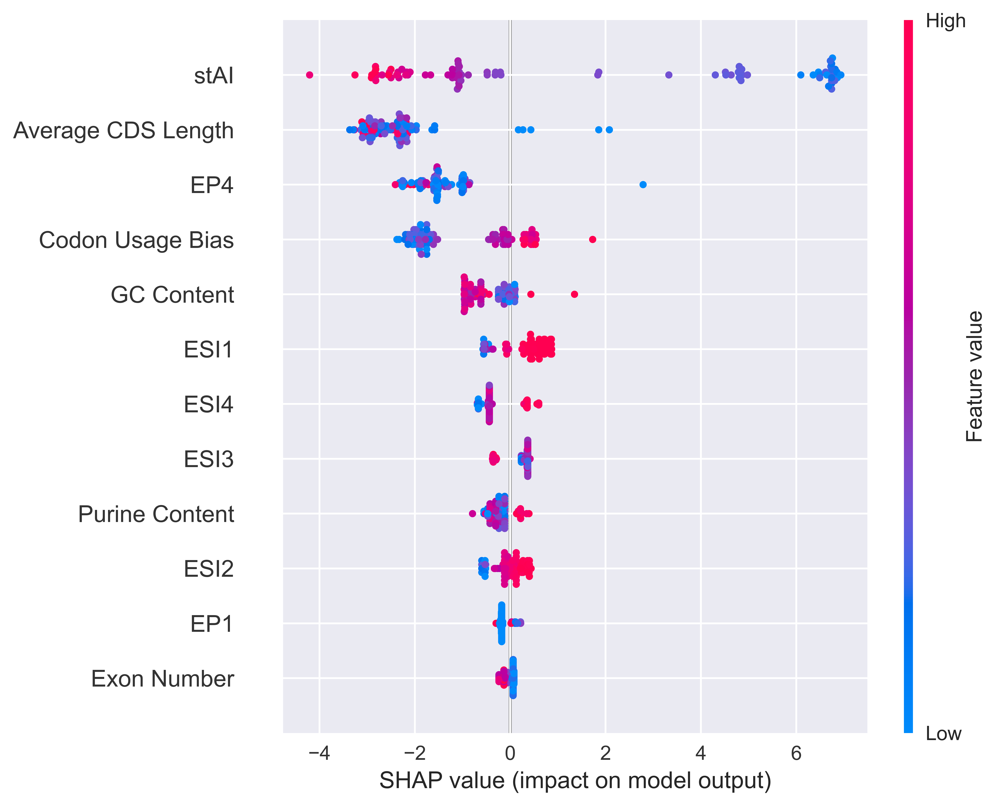

In [107]:
explainer = shap.Explainer(clf_xgb_best)
shap_values = explainer(X_test)
explanation = shap.Explanation(values=shap_values, feature_names=X_test.columns)
shap.summary_plot(explanation)

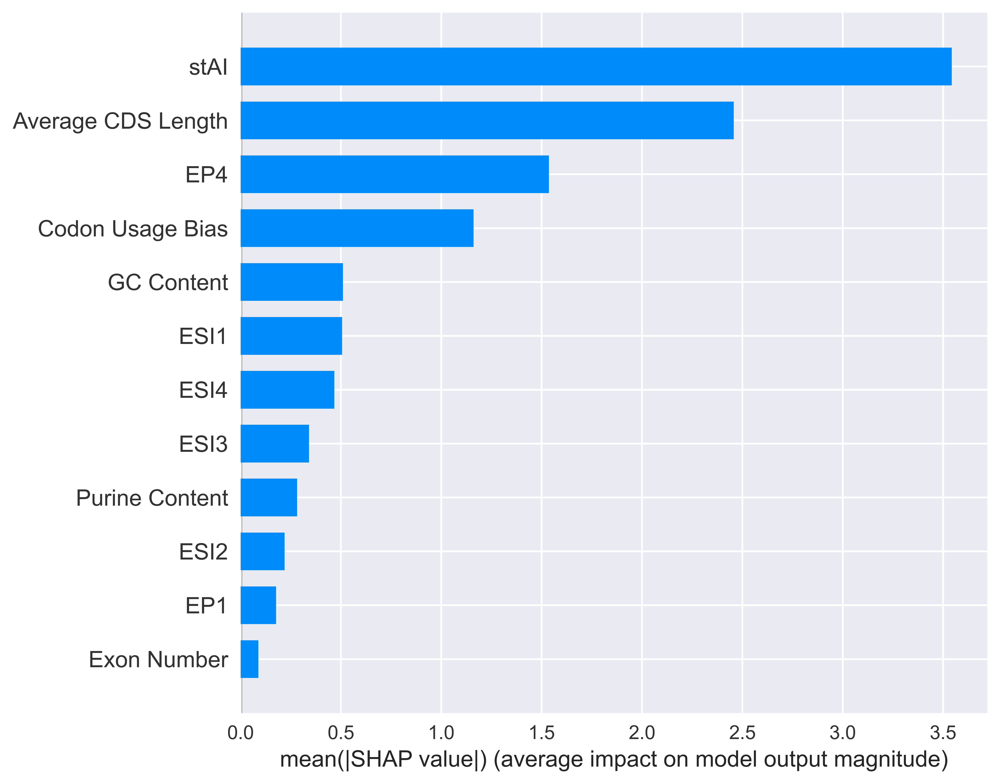

In [108]:
shap.summary_plot(explanation,plot_type="bar")

In [109]:
def custom_bar_plot(explanation):
    shap_values = explanation.values
    mean_abs_shap = np.abs(shap_values).mean(0)
    sorted_idx = np.argsort(-mean_abs_shap).astype(int)
    sorted_shap = shap_values[:, sorted_idx]
    sorted_features = np.array(explanation.feature_names)[sorted_idx][::-1] 
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.barh(sorted_features, mean_abs_shap[sorted_idx][::-1], color='blue', alpha=0.7)
    ax.set_xlabel('Mean Absolute SHAP Value')
    ax.set_ylabel('Features')
    ax.set_title('Custom SHAP Bar Plot')
    
    plt.tight_layout()
    plt.show()

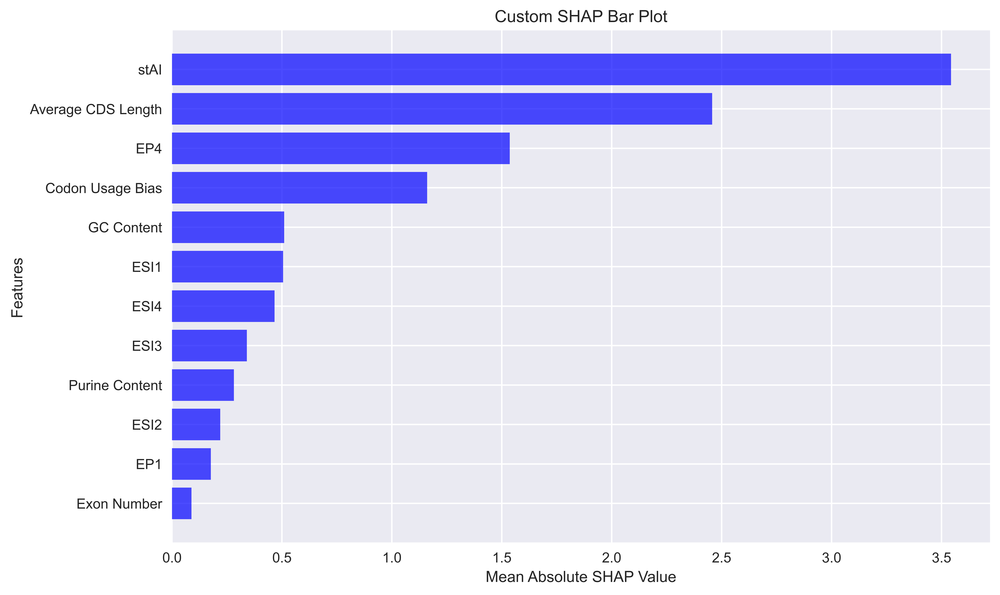

In [110]:
explainer = shap.Explainer(clf_xgb_best)
shap_values = explainer(X_test)
explanation = shap.Explanation(values=shap_values, feature_names=X_test.columns)
custom_bar_plot(explanation)

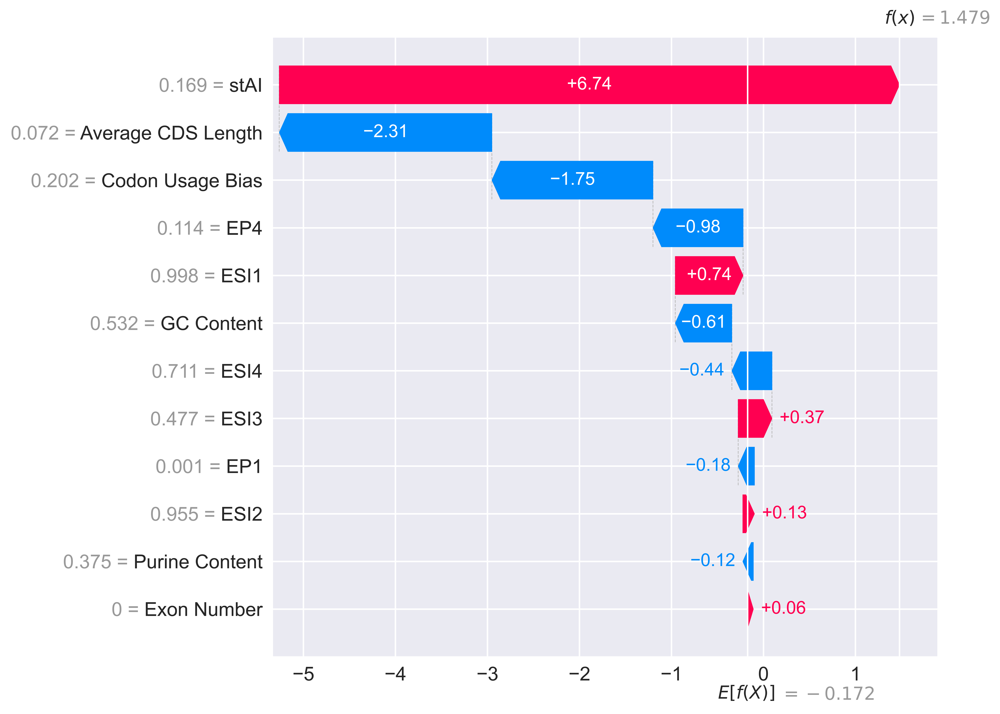

In [111]:
shap.waterfall_plot(shap_values[11], max_display=12)

In [112]:
indices_combined = [ 0, 5, 6, 7, 8, 9, 11, 18, 19, 24, 26, 35, 38, 40, 41, 46, 47, 52, 55, 65, 67, 68, 69, 73, 74, 76, 79, 81, 83, 85, 87]
X_test_positive = X_test.loc[indices_combined, :]
X_test_negative = X_test.loc[~X_test.index.isin(indices_combined), :]
y_pred_positive = clf_xgb_best.predict(X_test_positive)
y_pred_negative = clf_xgb_best.predict(X_test_negative)
print("Predicted values for datasets with a prediction of 1: ")
print(y_pred_positive)
print(len(y_pred_positive))
print("Predicted values for datasets with a prediction of 0: ")
print(y_pred_negative)
print(len(y_pred_negative))

Predicted values for datasets with a prediction of 1: 
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1]
31
Predicted values for datasets with a prediction of 0: 
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
57


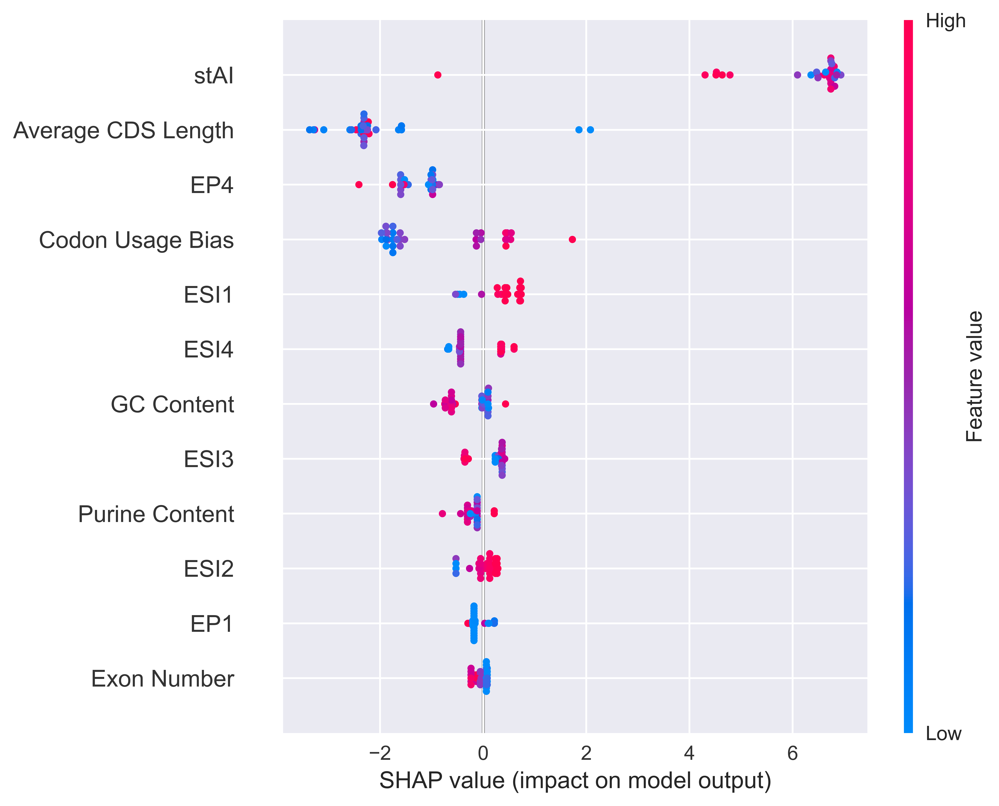

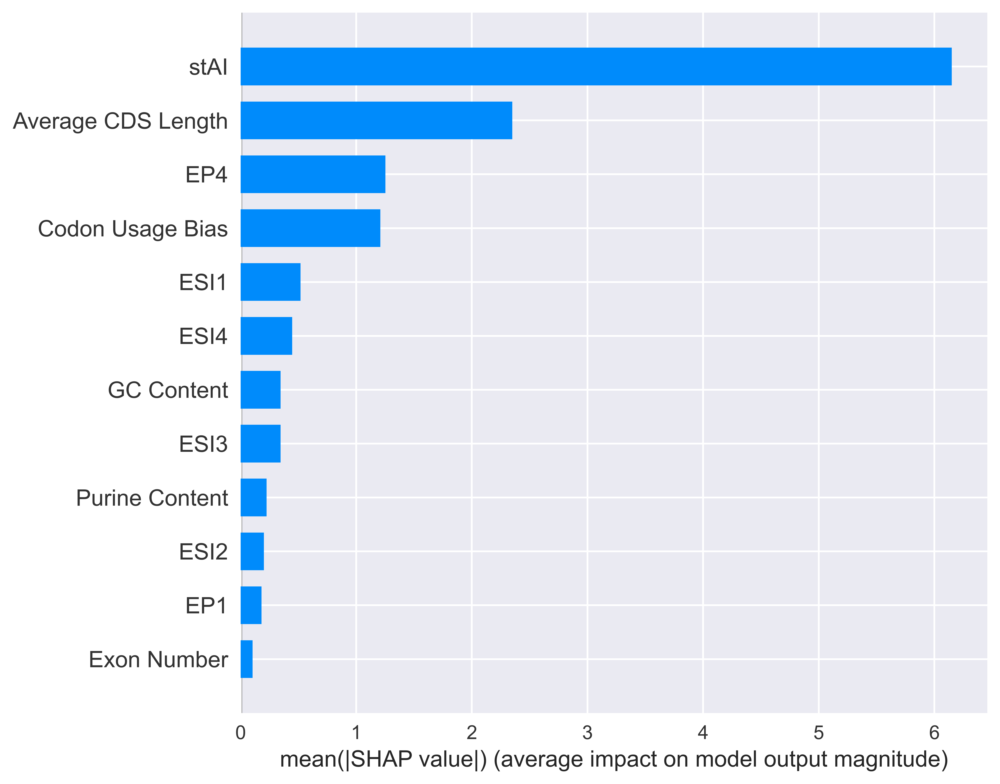

In [113]:
explainer = shap.Explainer(clf_xgb_best)
shap_values_positive = explainer.shap_values(X_test_positive)
shap.summary_plot(shap_values_positive, X_test_positive)
shap.summary_plot(shap_values_positive, X_test_positive, plot_type="bar")

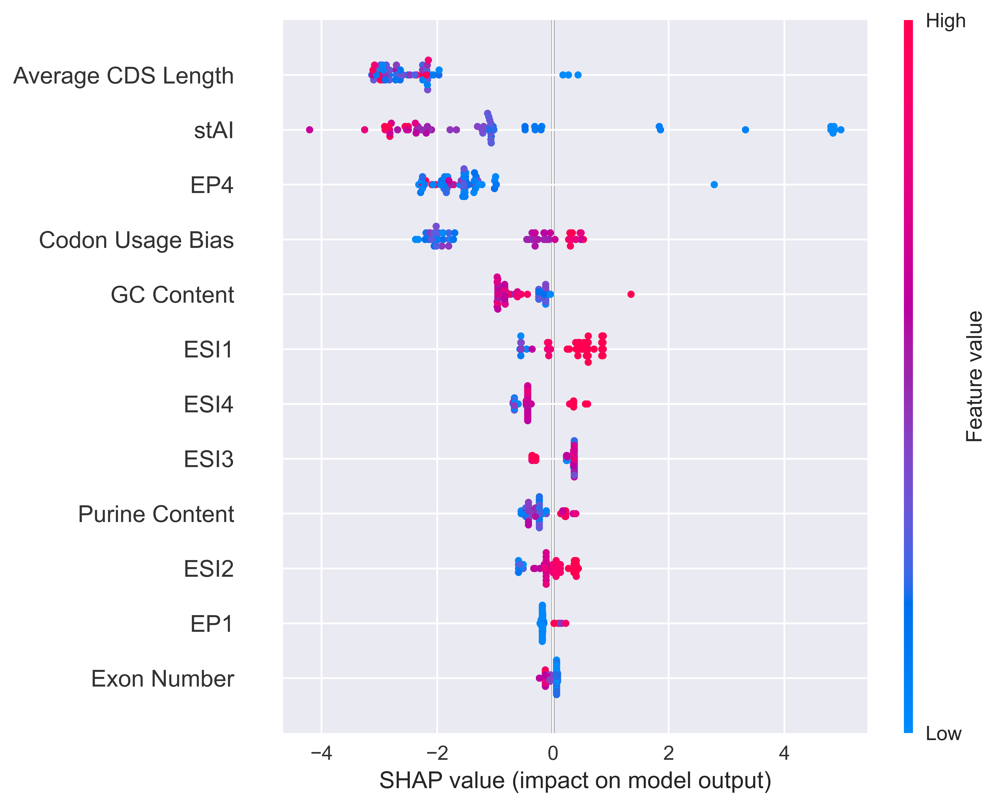

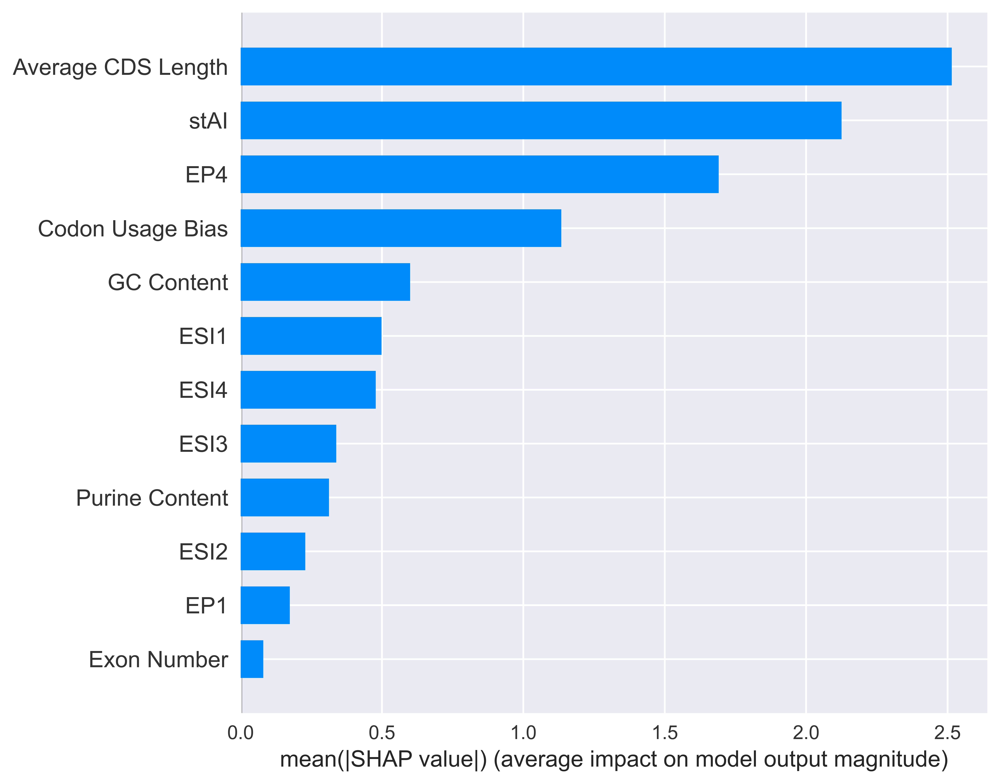

In [114]:
shap_values_negative = explainer.shap_values(X_test_negative)
shap.summary_plot(shap_values_negative, X_test_negative)
shap.summary_plot(shap_values_negative, X_test_negative, plot_type="bar")

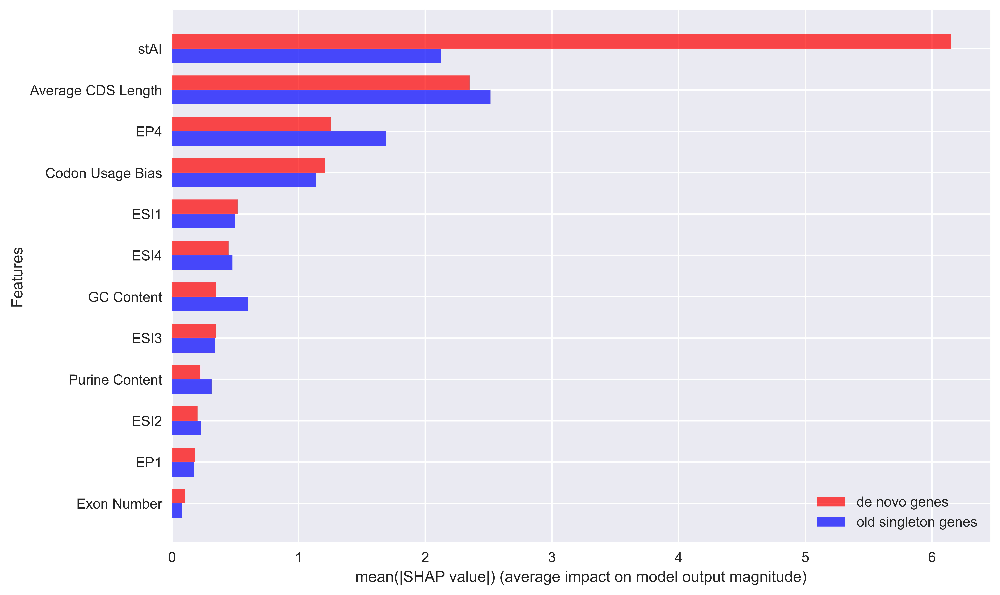

In [115]:
def custom_bar_plot(positive_explanation, negative_explanation):
    positive_shap_values = positive_explanation.values
    positive_feature_names = positive_explanation.feature_names
    negative_shap_values = negative_explanation.values
    negative_feature_names = negative_explanation.feature_names
    positive_mean_abs_shap = np.abs(positive_shap_values).mean(0)
    negative_mean_abs_shap = np.abs(negative_shap_values).mean(0)
    sorted_idx = np.argsort(-positive_mean_abs_shap).astype(int)
    sorted_features = np.array(positive_feature_names)[sorted_idx][::-1]
    num_features = len(sorted_features)
    
    fig, ax = plt.subplots(figsize=(10, 6))
    bar_width = 0.35
    r = np.arange(num_features)
    ax.barh(r, negative_mean_abs_shap[sorted_idx][::-1], color='blue', alpha=0.7, height=bar_width, label='X_test_negative', align='center')
    ax.barh(r + bar_width, positive_mean_abs_shap[sorted_idx][::-1], color='red', alpha=0.7, height=bar_width, label='X_test_positive', align='center')
    ax.set_yticks(r + bar_width / 2)
    ax.set_yticklabels(sorted_features) 
   
    ax.set_xlabel('mean(|SHAP value|) (average impact on model output magnitude)')
    ax.set_ylabel('Features')
    
    custom_legend = [plt.Rectangle((0, 0), 1, 1, fc="red", alpha=0.7), 
                     plt.Rectangle((0, 0), 1, 1, fc="blue", alpha=0.7)]
    ax.legend(custom_legend, ['de novo genes', 'old singleton genes'], loc='lower right')
    
    plt.tight_layout()
    plt.show()

positive_explanation = shap.Explanation(values=shap_values_positive, 
                                        data=X_test_positive,
                                        feature_names=X_test_positive.columns)

negative_explanation = shap.Explanation(values=shap_values_negative, 
                                        data=X_test_negative,
                                        feature_names=X_test_negative.columns)

custom_bar_plot(positive_explanation, negative_explanation)